In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os, scipy
import matplotlib.colors as mcolors
import networkx as nx
import pickle

from fastdtw import fastdtw
from scipy.spatial.distance import euclidean

# We import the model, stimuli, and the optimal control package
from neurolib.models.wc import WCModel
from neurolib.utils.stimulus import ZeroInput
from neurolib.control.optimal_control import oc_wc, cost_functions
from neurolib.control.optimal_control.oc_utils.plot_oc import plot_oc_network

# This will reload all imports as soon as the code changes
%load_ext autoreload
%autoreload 2

options = {
    'node_color': 'lightgray',
    'node_size': 1000,
    'width': 2,
    'arrowstyle': '-|>',
    'arrowsize': 20,
    'font_size' : 20,
    'font_weight' : 'bold',
    }

while "Promotion/neurolib" in os.getcwd():
    os.chdir('..')

pickledir = os.path.join(os.getcwd(), "neurolib_aln_osc_datastorage/optimal_control/examples/synchrony")
dir = os.path.join(pickledir, "images_5n_sim_mix")

print(dir)

/home/lena/Promotion/neurolib_aln_osc_datastorage/optimal_control/examples/synchrony/images_5n_sim_mix


In [3]:
def draw_nwgraph(cmat, filename):
    G = nx.DiGraph() 
    for n in range(cmat.shape[0]):
            for l in range(cmat.shape[1]):
                if cmat[n,l] != 0:
                    G.add_edge(l,n)
    nx.draw(G, with_labels=True, arrows=True, **options)
    plt.savefig(os.path.join(dir,filename), bbox_inches='tight')
    plt.show()

def getperiods(x, dt, N, prominence=0.01, interval=(None, None)):

    timing_list = [None for n in range(N)]
    periods_list = [None for n in range(N)]

    if interval[0] is None:
        interval[0] = 0
    if interval[1] is None:
        interval[1] = -1

    for n in range(N):
        timing_list[n] = scipy.signal.find_peaks(x[n, 0, interval[0]:interval[1]], prominence=prominence)[0]
        periods_list[n] = []
        if len(timing_list[n]) < 3:
            continue
        for pind in range(1, len(timing_list[n])):
            periods_list[n].append(dt * (timing_list[n][pind]-timing_list[n][pind-1]))

    return timing_list, periods_list

def getperiod(x, dt):
    periods = []
    for n in range(x.shape[0]):
        peaks = scipy.signal.find_peaks(x[n,:])[0]
        for p in range(2, len(peaks)-1):
            periods.append(peaks[p] - peaks[p-1])
        
        return np.mean(periods) * dt
    

def get_sim(state, N, period_dt):
    distsum = 0.
    for n in range(N):
        peaks = scipy.signal.find_peaks(-state[n,0,:], prominence=0.01)[0]
        i0_0, i0_1 = peaks[0], peaks[1]
        cycle0 = state[n,0,i0_0:i0_1]

        if n == 0:
            ii0 = 3
            while peaks[ii0] < 1000:
                ii0 += 1
            iii0 = peaks[ii0]
        else:
            ii0 = 3
            while np.abs(iii0 - peaks[ii0]) > period_dt:
                ii0 += 1
        i1_0, i1_1 = peaks[ii0], peaks[ii0+1]
        cycle1 = state[n,0,i1_0:i1_1]

        dtw_distance, warp_path = fastdtw(cycle0, cycle1, dist=euclidean)
        distsum += dtw_distance
    
    return distsum

In [4]:
N = 5
cmats, dmats = [], []

In [5]:
with open(os.path.join(pickledir, 'snyc_5n_sim_mix.pickle'), 'rb') as f:
    res_read = pickle.load(f)
    print(res_read.keys() )

results = res_read.copy()
cmats = results["cmats"].copy()
dmats = results["dmats"].copy()

print(cmats)

dict_keys(['controls', 'periods', 'timings', 'states', 'nat_periods', 'w2', 'L2cost', 'distance', 'cmats', 'dmats'])
[array([[0, 1, 0, 0, 0],
       [1, 0, 1, 0, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 1, 0]]), array([[0, 0, 1, 1, 1],
       [0, 0, 1, 0, 1],
       [1, 1, 0, 0, 1],
       [0, 1, 0, 0, 0],
       [1, 1, 1, 0, 0]]), array([[0, 1, 1, 1, 1],
       [1, 0, 1, 1, 1],
       [0, 0, 0, 1, 1],
       [1, 1, 1, 0, 1],
       [1, 1, 1, 1, 0]])]


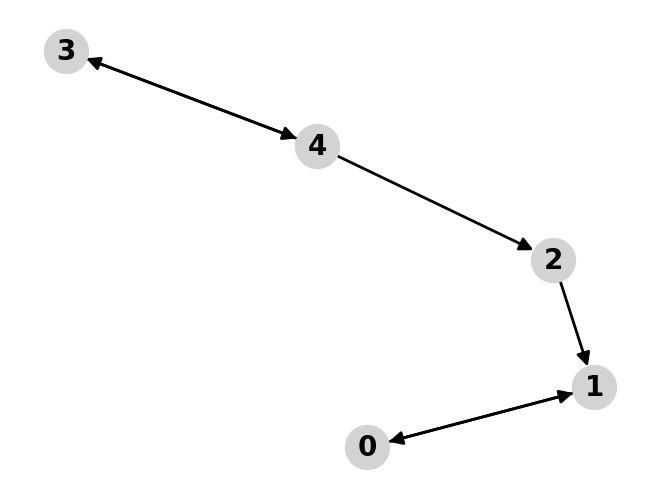

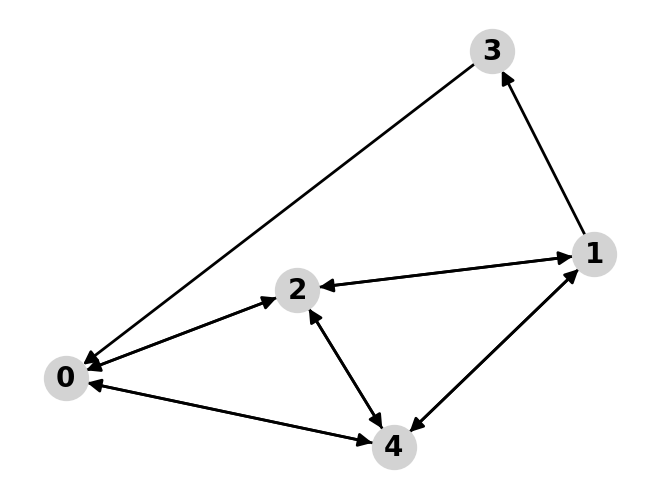

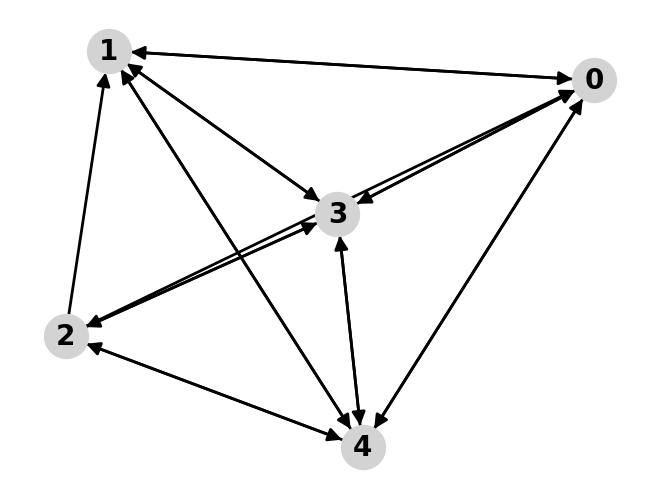

In [143]:
while len(cmats) < 3:
    p_connect = 0.1 * (len(cmats) + 1)**2
    p_inv = 1. - p_connect
    cmat = np.random.choice([0, 1], size=(N,N), p=[p_inv, p_connect])
    use = True
    for n in range(N):
        cmat[n, n] = 0
        if np.amax(cmat[n,:]) == 0:
            use = False
            break
        if np.amax(cmat[:,n]) == 0:
            use = False
            break

    for j in range(len(cmats)):
        if (cmat == cmats[j]).all():
            use = False

    if not use:
        continue

    print(np.sum(cmat))
    cmats.append(cmat)

    dmat = np.random.random((N, N))
    for n1 in range(N):
        for n2 in range(N):
            dmat[n1, n2] *= 30. * cmat[n1,n2]

    dmats.append(np.around(dmat, 0))

for i in range(len(cmats)):
 
    draw_nwgraph(cmats[i], "network_" + str(i) + ".png")
    #print(cmats[-1])
    #print(dmats[-1])

In [6]:
colors = []
n = 0
for col in mcolors.TABLEAU_COLORS:
    colors.append(col)
    n += 1
    if n >= N: break

points = [ [1., 0.1], [1.3, 0.3], [1.6, 0.5] ]

periods_array = np.zeros((len(cmats), len(points)))

----------------
0 0


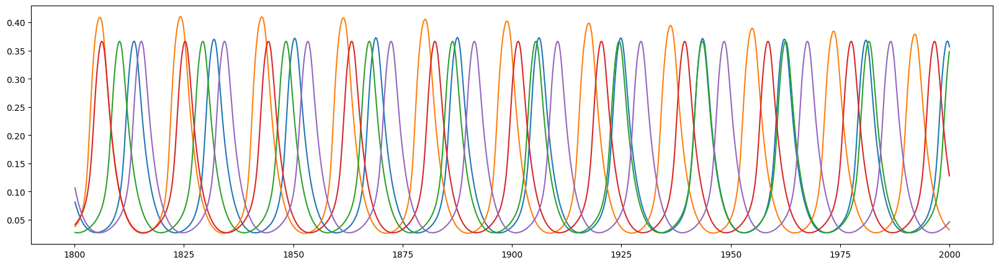

period =  18.226315789473684
period diff =  0.05789473684210478
amplitudes =  [0.3728557649408735, 0.39864776637991406, 0.36643540682443093, 0.36643540682443093, 0.3664282917737756] 0.39864776637991406 0.3664282917737756
mean dt =  5.444
----------------
0 1


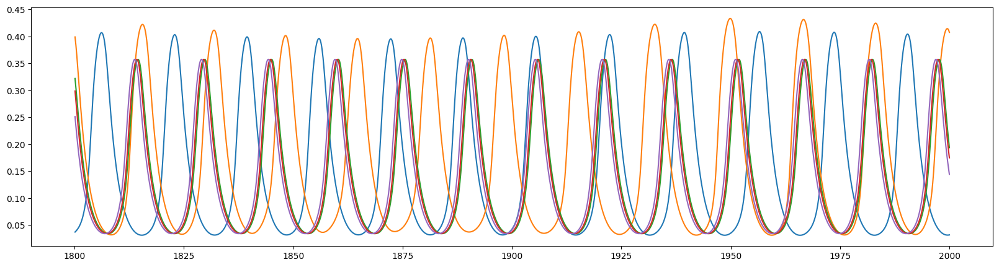

period =  16.761904761904763
period diff =  -0.004761904761902969
amplitudes =  [0.40889126646211854, 0.4332532935106357, 0.3574670884842699, 0.3574670884842699, 0.3574677391448838] 0.4332532935106357 0.3574670884842699
mean dt =  2.0623376623376624
----------------
0 2


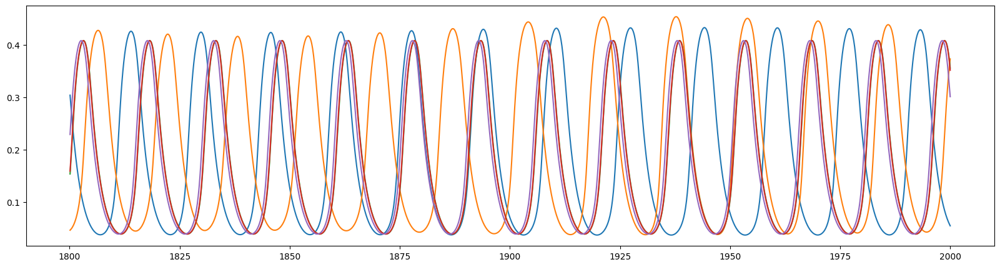

period =  16.290909090909093
period diff =  0.0
amplitudes =  [0.4324495497717453, 0.45324588347912714, 0.4075925244497257, 0.4075925244497257, 0.40759243138949575] 0.45324588347912714 0.40759243138949575
mean dt =  1.9029535864978904
----------------
1 0


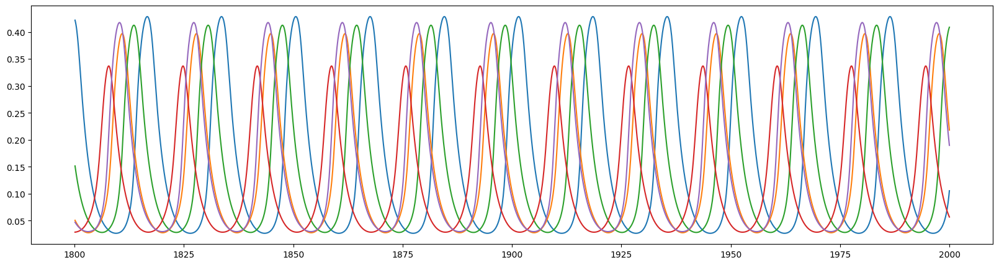

period =  16.98
period diff =  -0.0009523809523805937
amplitudes =  [0.4286642151148189, 0.3970534589225992, 0.4126503245961004, 0.33705807069723853, 0.4176145641141331] 0.4286642151148189 0.33705807069723853
mean dt =  3.146818181818182
----------------
1 1


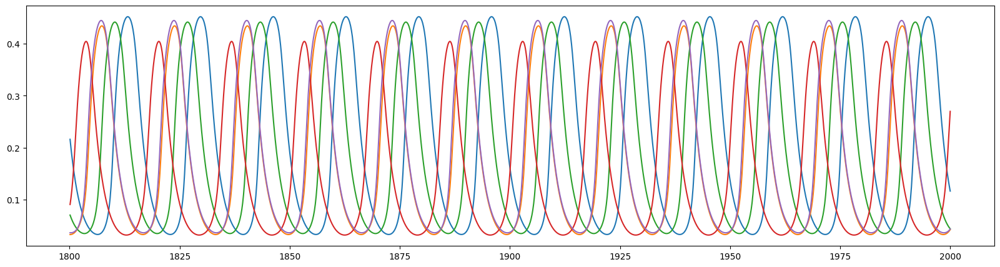

period =  16.52857142857143
period diff =  0.004761904761902969
amplitudes =  [0.4520988442703852, 0.43446496485699004, 0.4417482780522648, 0.40454651284779725, 0.4448314335324408] 0.4520988442703852 0.40454651284779725
mean dt =  3.0596491228070177
----------------
1 2


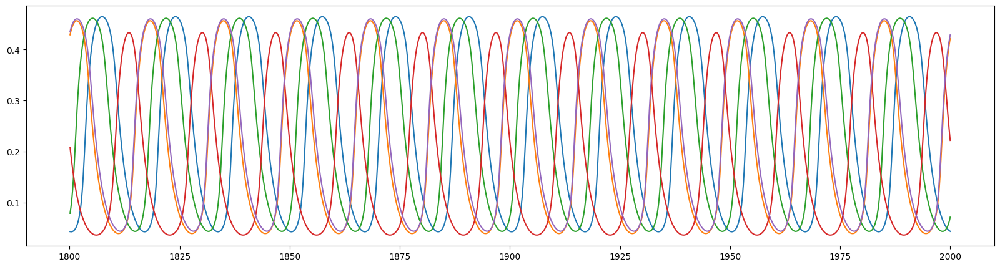

period =  16.671428571428574
period diff =  0.0
amplitudes =  [0.46416564271563626, 0.45620107727574516, 0.4611007665858645, 0.43297749836789956, 0.45994199300232713] 0.46416564271563626 0.43297749836789956
mean dt =  3.5506726457399105
----------------
2 0


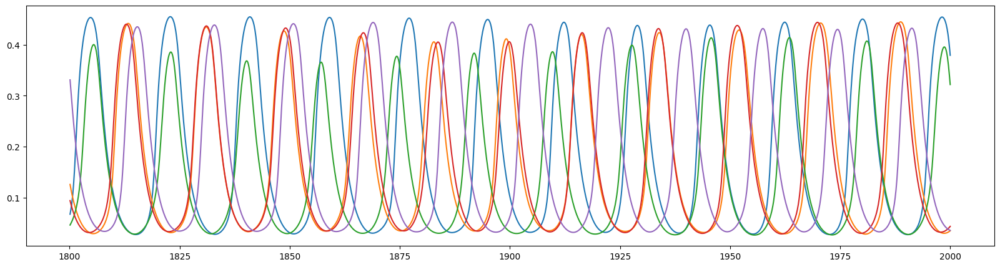

period =  17.535
period diff =  0.0
amplitudes =  [0.45414205366853505, 0.4447083022469885, 0.4138423986436207, 0.4437019666069047, 0.44017924947978726] 0.45414205366853505 0.4138423986436207
mean dt =  4.813953488372093
----------------
2 1


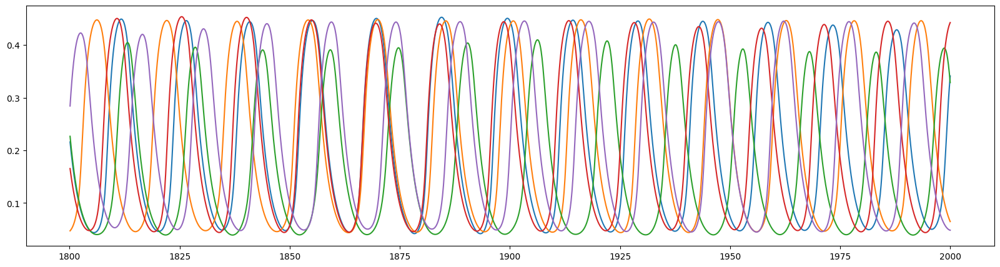

period =  14.662500000000001
period diff =  0.10000000000000142
amplitudes =  [0.4472130179401426, 0.4493569804067839, 0.40979207032114456, 0.4462681252929763, 0.44558575549133056] 0.4493569804067839 0.40979207032114456
mean dt =  3.91336032388664
----------------
2 2


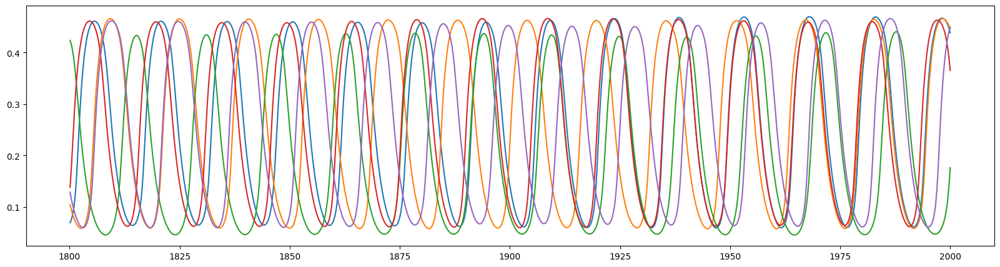

period =  14.933333333333335
period diff =  -0.008333333333331083
amplitudes =  [0.4698403789960873, 0.46603480331822866, 0.44055483022891573, 0.46647529032719365, 0.46621531371521613] 0.4698403789960873 0.44055483022891573
mean dt =  4.071308016877637


In [10]:
plt_list = []
mean_dt = np.zeros((len(cmats), len(points)))
i0, i1 = 18000, 20000

for c in range(len(cmats)):
    model = WCModel(Cmat=cmats[c], Dmat=dmats[c])

    dt = model.params['dt']
    model.params['duration'] = 2. * 1000
    model.params.signalV = 1.

    zero_input = ZeroInput().generate_input(duration=model.params['duration']+model.params.dt, dt=model.params.dt)
    rect_input = np.vstack( (zero_input)*2 )
    rect_input[0,:500] = -5.
    rect_input[0,10000:10500] = 5.

    for pind in range(len(points)):
        print("----------------")
        print(c, pind)
        model.params["exc_ext"] = points[pind][0] + rect_input[0,:]
        model.params["inh_ext"] = points[pind][1]
        model.run()

        if [c, pind] in plt_list or True:
            fig, ax = plt.subplots(figsize=(20,5))
            for n in range(N):
                ax.plot(model.t[i0:i1], model.exc[n,i0:i1], color=colors[n])
            plt.show()

        periods_array[c, pind] = getperiod(model.exc[:,-4000:], dt)
        print("period = ", periods_array[c, pind])
        alt_period = getperiod(model.exc[:,6000:10000], dt)
        print("period diff = ", periods_array[c, pind] - alt_period)

        amps = []
        for n in range(N):
            amps.append(np.amax(model.exc[n,-1000:]))

        print("amplitudes = ", amps, np.amax(amps), np.amin(amps))

        timings = []
        for n in range(N):
            timings.append(scipy.signal.find_peaks(model.exc[n,-10000:])[0])

        list_mean_dt = []
        for n1 in range(N):
            list_dt = []
            for n2 in range(N):
                if n1 == n2:
                    continue
                for ti in timings[n2][1:-2]:
                    list_dt.append(np.amin(np.abs(timings[n1] - ti)))

            list_mean_dt = np.mean(list_dt)

        #print(list_dt)

        mean_dt[c, pind] = np.amin(list_mean_dt) * model.params.dt
        print("mean dt = ", mean_dt[c, pind])


In [11]:
controlmat = np.zeros((N,2))
controlmat[:,0] = 1.

costmat = np.zeros((N, 2))
costmat[:,0] = 1.

duration = 200.
model.params.duration = duration
zero_input0 = ZeroInput().generate_input(duration=duration+model.params.dt, dt=model.params.dt)
zero_input = np.vstack( ([zero_input0]*2) )[np.newaxis,:,:]
zero_control = np.vstack( ([zero_input]*N))

w2_n = 30

In [162]:
results = dict()
results["controls"] = [[[[ None for x1 in range(w2_n) ] for x2 in range(4)] for x3 in range(len(points))] for x4 in range(len(cmats)) ]
results["periods"] =  [[[[ None for x1 in range(w2_n) ] for x2 in range(4)] for x3 in range(len(points))] for x4 in range(len(cmats)) ]
results["timings"] =  [[[[ None for x1 in range(w2_n) ] for x2 in range(4)] for x3 in range(len(points))] for x4 in range(len(cmats)) ]
results["states"] =   [[[[ None for x1 in range(w2_n) ] for x2 in range(4)] for x3 in range(len(points))] for x4 in range(len(cmats)) ]
results["nat_periods"] =  np.zeros((len(cmats), len(points), 4, w2_n))
results["w2"] = np.zeros((len(cmats), len(points), 4, w2_n ))
results["L2cost"] = np.zeros((len(cmats), len(points), 4, w2_n ))
results["distance"] = np.zeros((len(cmats), len(points), 4, w2_n ))
results["cmats"] = cmats
results["dmats"] = dmats

In [163]:
skip_array = [ ]

c =  0
pind =  0
target period =  18.226315789473684
imet, w2 =  0 1000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.10088708974752682
Converged in iteration 2 with cost -0.10088776227525799
Final cost : -0.10088776227525799
L2 cost =  3.817640118523375e-09
control zero, decrease w2 to  500.0
Compute control for a deterministic system
Cost in iteration 0: -0.10088708974752682
Converged in iteration 2 with cost -0.10088708974752682
Final cost : -0.10088708974752682
L2 cost =  0.0
control zero, decrease w2 to  250.0
Compute control for a deterministic system
Cost in iteration 0: -0.10088708974752682
Converged in iteration 4 with cost -0.10088999726309272
Final cost : -0.10088999726309272
L2 cost =  1.0775452712113343e-07
control zero, decrease w2 to  125.0
Compute control for a deterministic system
Cost in iteration 0: -0.10088708974752682
Converged in iteration 2 with cost -0.10089247059863674
Final cost : -0.1008924

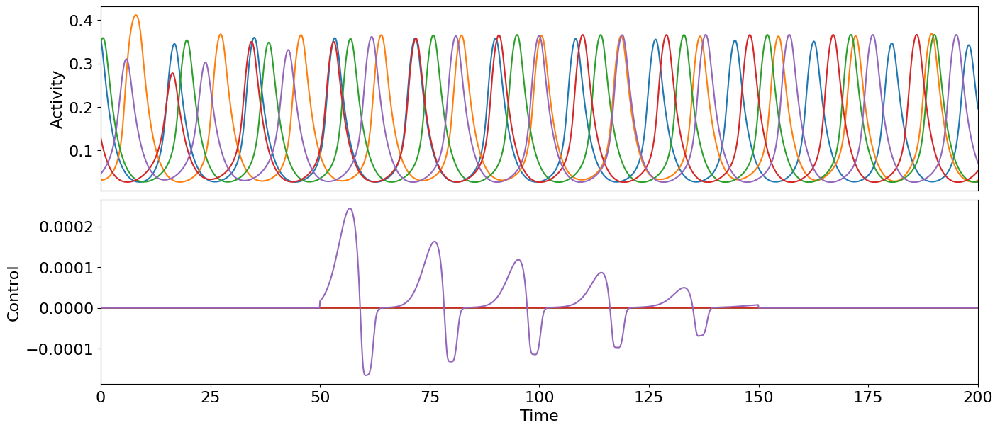

imet, w2 =  1 1000000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 6.470703490002065
Cost in iteration 10: 6.470694045685862
Converged in iteration 16 with cost 6.470694045685861
Final cost : 6.470694045685861
L2 cost =  9.631996508377544e-11
control zero, decrease w2 to  500000.0
Compute control for a deterministic system
Cost in iteration 0: 6.470703490002065
Cost in iteration 10: 6.470684601315641
Converged in iteration 15 with cost 6.470684601315635
Final cost : 6.470684601315635
L2 cost =  3.8528186211655005e-10
control zero, decrease w2 to  250000.0
Compute control for a deterministic system
Cost in iteration 0: 6.470703490002065
Cost in iteration 10: 6.470665712413053
Converged in iteration 13 with cost 6.470665712413043
Final cost : 6.470665712413043
L2 cost =  1.5411434676834253e-09
control zero, decrease w2 to  125000.0
Compute control for a deterministic system
Cost in iteration 0: 6.470703490002065
Cost in 

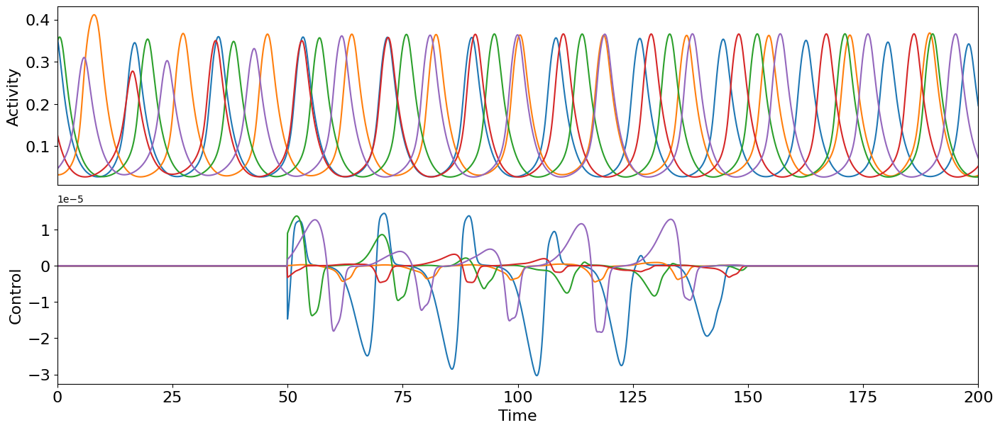

imet, w2 =  2 10000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.2679701999430712
Cost in iteration 10: 0.2679690893799438
Cost in iteration 20: 0.26796908843306894
Converged in iteration 26 with cost 0.2679690884330686
Final cost : 0.2679690884330686
L2 cost =  1.1614330924416317e-09
control zero, decrease w2 to  5000.0
Compute control for a deterministic system
Cost in iteration 0: 0.2679701999430712
Cost in iteration 10: 0.26796797880649925
Cost in iteration 20: 0.26796797691258817
Converged in iteration 22 with cost 0.26796797691258817
Final cost : 0.26796797691258817
L2 cost =  4.645762413945566e-09
control zero, decrease w2 to  2500.0
Compute control for a deterministic system
Cost in iteration 0: 0.2679701999430712
Cost in iteration 10: 0.2679657576286633
Cost in iteration 20: 0.26796575384019744
Converged in iteration 20 with cost 0.26796575384019744
Final cost : 0.26796575384019744
L2 cost =  1.8583290291764

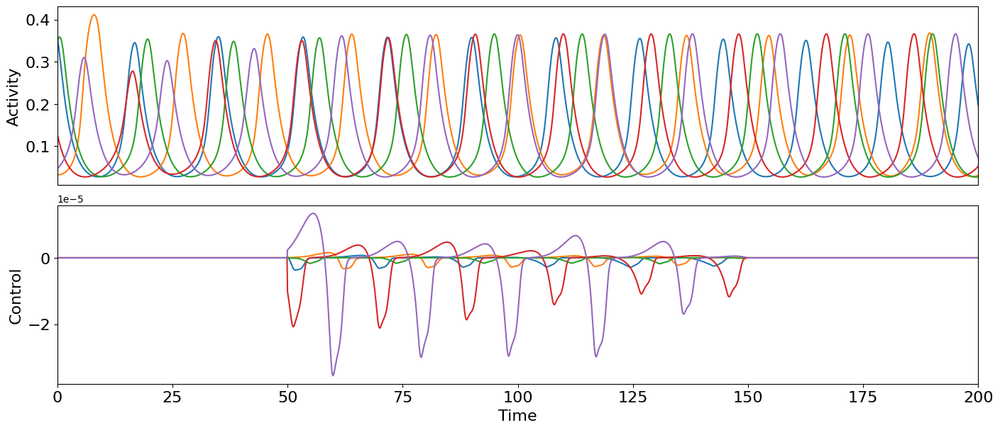

pind =  1
target period =  16.761904761904763
imet, w2 =  0 1000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.29878742822273036
Converged in iteration 4 with cost -0.29883062881805056
Final cost : -0.29883062881805056
L2 cost =  1.7839730267768381e-07
control zero, decrease w2 to  500.0
Compute control for a deterministic system
Cost in iteration 0: -0.29878742822273036
Cost in iteration 10: -0.2988950332775554
Cost in iteration 20: -0.29889519315148877
Cost in iteration 30: -0.29889519353221333
Final cost : -0.29889519353221333
L2 cost =  1.501210159246322e-06
control zero, decrease w2 to  250.0
Compute control for a deterministic system
Cost in iteration 0: -0.29878742822273036
Cost in iteration 10: -0.299013747022679
Cost in iteration 20: -0.2990137472437292
Cost in iteration 30: -0.2990139491685433
Final cost : -0.2990139491685433
L2 cost =  7.459686057093108e-06
control zero, decrease w2 to  125.0
Compute contr

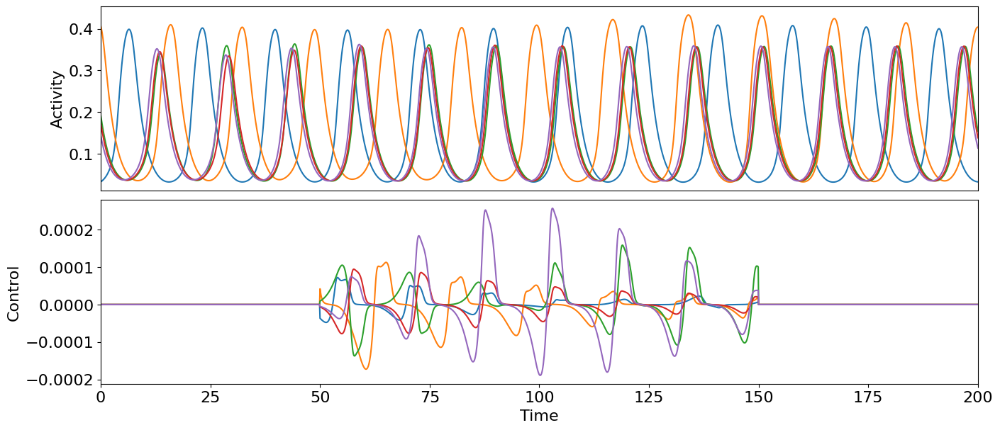

imet, w2 =  1 1000000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -11.448624398612138
Cost in iteration 10: -11.448670096023303
Converged in iteration 13 with cost -11.448670096023305
Final cost : -11.448670096023305
L2 cost =  5.131828854218638e-10
control zero, decrease w2 to  500000.0
Compute control for a deterministic system
Cost in iteration 0: -11.448624398612138
Cost in iteration 10: -11.448715790951542
Converged in iteration 12 with cost -11.448715790951542
Final cost : -11.448715790951542
L2 cost =  2.0526997601167077e-09
control zero, decrease w2 to  250000.0
Compute control for a deterministic system
Cost in iteration 0: -11.448624398612138
Converged in iteration 8 with cost -11.448800666042931
Final cost : -11.448800666042931
L2 cost =  9.446716342258876e-09
control zero, decrease w2 to  125000.0
Compute control for a deterministic system
Cost in iteration 0: -11.448624398612138
Cost in iteration 10: -11.

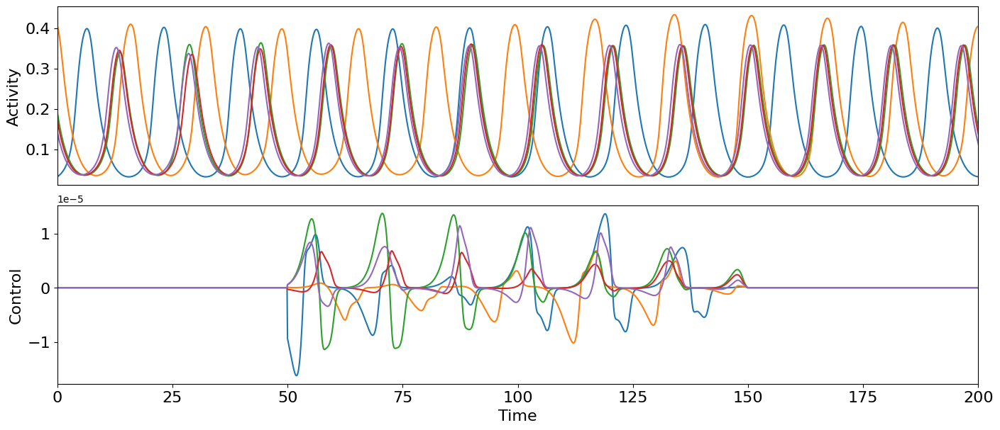

imet, w2 =  2 10000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.05643821813461492
Cost in iteration 10: 0.056438029230870705
Cost in iteration 20: 0.056438029056746414
Converged in iteration 22 with cost 0.056438029056746414
Final cost : 0.056438029056746414
L2 cost =  2.1583273060568577e-10
control zero, decrease w2 to  5000.0
Compute control for a deterministic system
Cost in iteration 0: 0.05643821813461492
Cost in iteration 10: 0.05643784033644218
Converged in iteration 19 with cost 0.056437839988972845
Final cost : 0.056437839988972845
L2 cost =  8.633211193614624e-10
control zero, decrease w2 to  2500.0
Compute control for a deterministic system
Cost in iteration 0: 0.05643821813461492
Cost in iteration 10: 0.05643746257552873
Converged in iteration 17 with cost 0.05643746188370773
Final cost : 0.05643746188370773
L2 cost =  3.453205970372398e-09
control zero, decrease w2 to  1250.0
Compute control for a deter

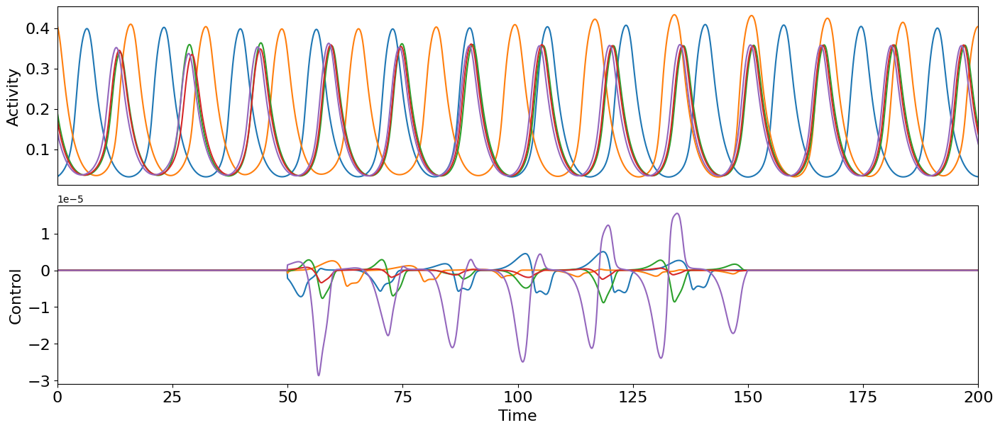

pind =  2
target period =  16.290909090909093
imet, w2 =  0 1000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.29878980975979713
Cost in iteration 10: -0.29886817812984534
Cost in iteration 20: -0.2988683062311315
Converged in iteration 22 with cost -0.2988683062311315
Final cost : -0.2988683062311315
L2 cost =  4.876305843865548e-07
control zero, decrease w2 to  500.0
Compute control for a deterministic system
Cost in iteration 0: -0.29878980975979713
Cost in iteration 10: -0.2989476230007062
Converged in iteration 19 with cost -0.29894762300070704
Final cost : -0.29894762300070704
L2 cost =  2.1585971688788436e-06
control zero, decrease w2 to  250.0
Compute control for a deterministic system
Cost in iteration 0: -0.29878980975979713
Cost in iteration 10: -0.29911983376674034
Cost in iteration 20: -0.29911983784150087
Converged in iteration 21 with cost -0.29911983784150087
Final cost : -0.29911983784150087
L2 cost 

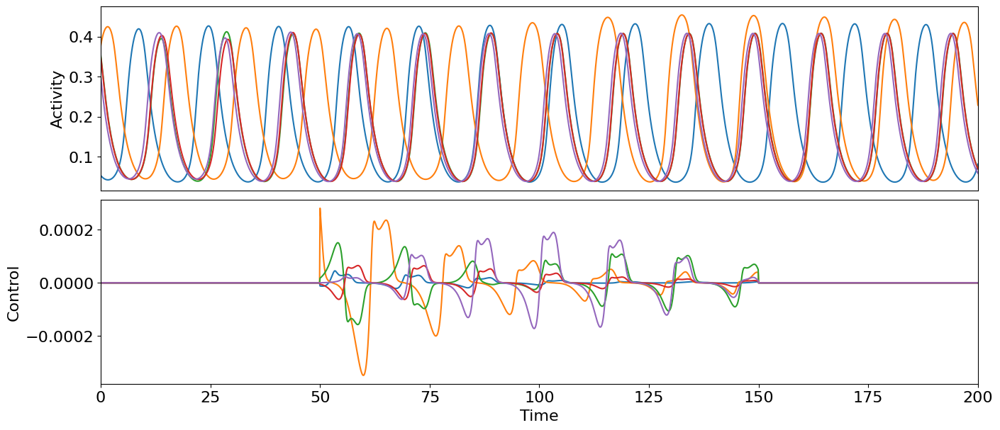

imet, w2 =  1 1000000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -12.94060412603033
Cost in iteration 10: -12.94063738912195
Converged in iteration 14 with cost -12.940637389121955
Final cost : -12.940637389121955
L2 cost =  3.498934725113232e-10
control zero, decrease w2 to  500000.0
Compute control for a deterministic system
Cost in iteration 0: -12.94060412603033
Cost in iteration 10: -12.940670652583846
Converged in iteration 16 with cost -12.940670652583858
Final cost : -12.940670652583858
L2 cost =  1.3995829396439059e-09
control zero, decrease w2 to  250000.0
Compute control for a deterministic system
Cost in iteration 0: -12.94060412603033
Cost in iteration 10: -12.940737180618639
Converged in iteration 13 with cost -12.940737180618646
Final cost : -12.940737180618646
L2 cost =  5.598403520214687e-09
control zero, decrease w2 to  125000.0
Compute control for a deterministic system
Cost in iteration 0: -12.940

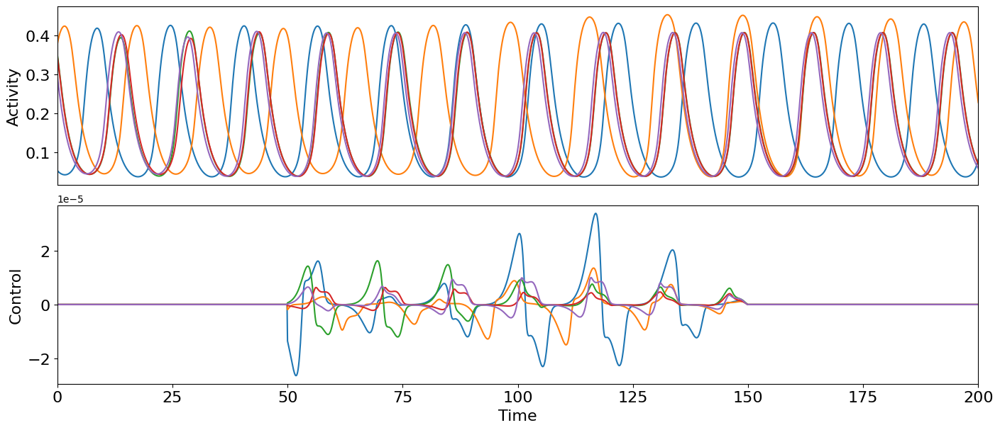

imet, w2 =  2 10000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.06834048063321514
Cost in iteration 10: 0.06834033223122947
Cost in iteration 20: 0.06834033133074313
Cost in iteration 30: 0.06834033131176293
Final cost : 0.06834033131176293
L2 cost =  1.5081386063766286e-10
control zero, decrease w2 to  5000.0
Compute control for a deterministic system
Cost in iteration 0: 0.06834048063321514
Cost in iteration 10: 0.06834018383334084
Cost in iteration 20: 0.06834018203281167
Cost in iteration 30: 0.06834018199491368
Final cost : 0.06834018199491368
L2 cost =  6.032517942208412e-10
control zero, decrease w2 to  2500.0
Compute control for a deterministic system
Cost in iteration 0: 0.06834048063321514
Cost in iteration 10: 0.06833988704985473
Cost in iteration 20: 0.06833988345056834
Cost in iteration 30: 0.06833988337502196
Final cost : 0.06833988337502196
L2 cost =  2.4129778056859343e-09
control zero, decrease w2 t

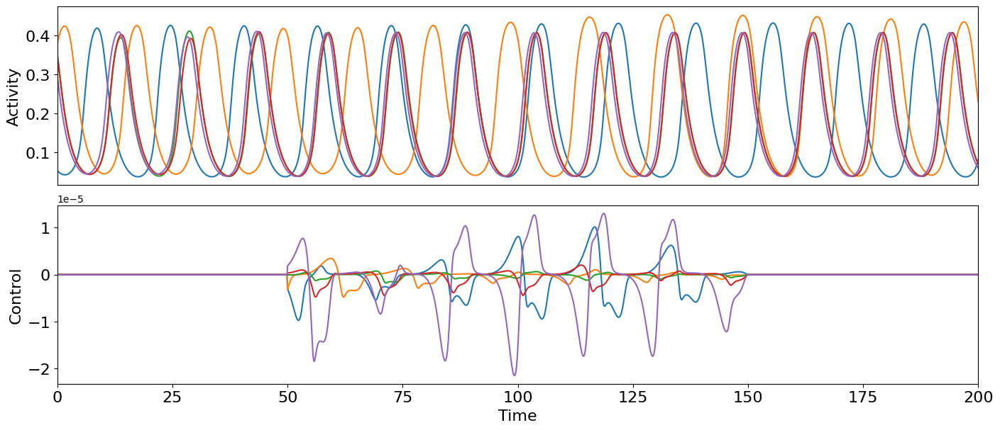

c =  1
pind =  0
target period =  16.98
imet, w2 =  0 1000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.37831933077838925
Converged in iteration 9 with cost -0.3783383149505558
Final cost : -0.3783383149505558
L2 cost =  1.2612007327898477e-07
control zero, decrease w2 to  500.0
Compute control for a deterministic system
Cost in iteration 0: -0.37831933077838925
Cost in iteration 10: -0.37836076441404376
Cost in iteration 20: -0.3783608084373211
Converged in iteration 22 with cost -0.3783608084373211
Final cost : -0.3783608084373211
L2 cost =  6.795889937394151e-07
control zero, decrease w2 to  250.0
Compute control for a deterministic system
Cost in iteration 0: -0.37831933077838925
Cost in iteration 10: -0.37840444773100573
Converged in iteration 12 with cost -0.37840444773100573
Final cost : -0.37840444773100573
L2 cost =  2.9417692359425823e-06
control zero, decrease w2 to  125.0
Compute control for a determinis

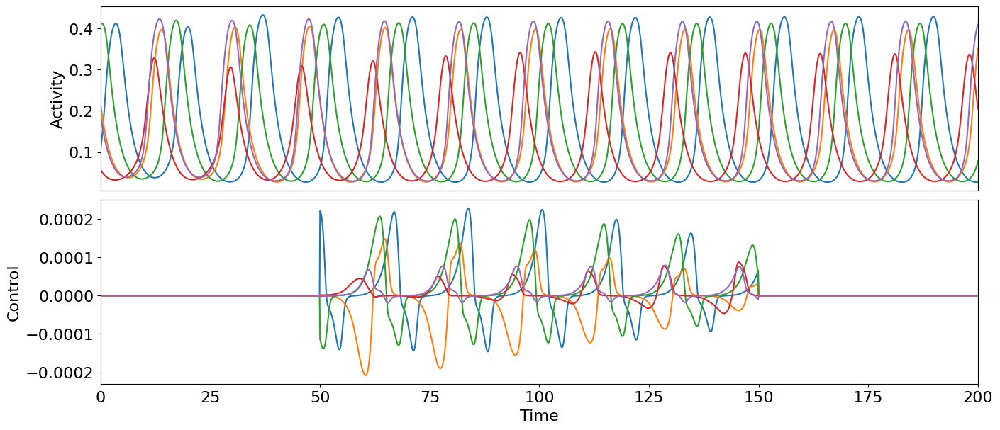

imet, w2 =  1 1000000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.5093970575295754
Cost in iteration 10: 0.5093061818101078
Cost in iteration 20: 0.5093061803509585
Converged in iteration 22 with cost 0.5093061803509585
Final cost : 0.5093061803509585
L2 cost =  9.208956313846732e-10
control zero, decrease w2 to  500000.0
Compute control for a deterministic system
Cost in iteration 0: 0.5093970575295754
Cost in iteration 10: 0.5092153041361032
Cost in iteration 20: 0.5092153012175769
Converged in iteration 21 with cost 0.5092153012175769
Final cost : 0.5092153012175769
L2 cost =  3.6836437359041135e-09
control zero, decrease w2 to  250000.0
Compute control for a deterministic system
Cost in iteration 0: 0.5093970575295754
Cost in iteration 10: 0.5090335429242927
Converged in iteration 19 with cost 0.5090335370861969
Final cost : 0.5090335370861969
L2 cost =  1.473506586032221e-08
control zero, decrease w2 to  125000

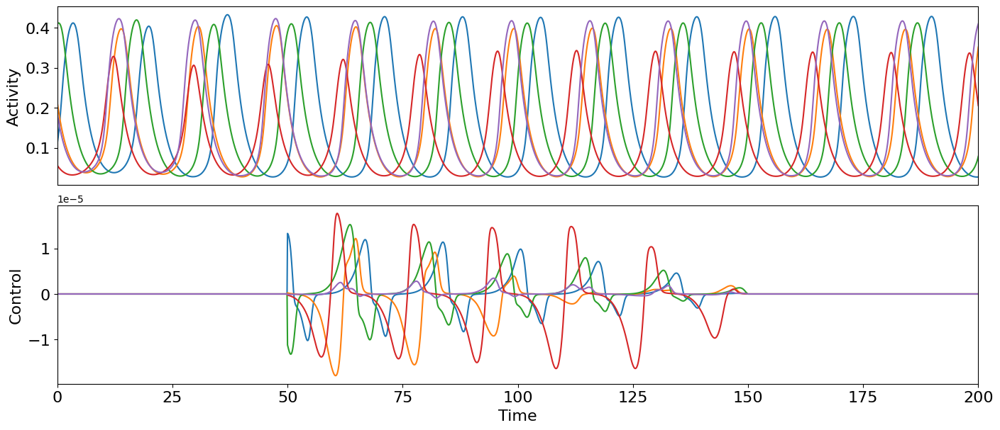

imet, w2 =  2 10000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.2493313770850944
Cost in iteration 10: 0.24933046024334293
Converged in iteration 13 with cost 0.24933046024334293
Final cost : 0.24933046024334293
L2 cost =  1.0908995143326762e-09
control zero, decrease w2 to  5000.0
Compute control for a deterministic system
Cost in iteration 0: 0.2493313770850944
Cost in iteration 10: 0.2493295433881185
Converged in iteration 15 with cost 0.24932954338811844
Final cost : 0.24932954338811844
L2 cost =  4.3636301490147235e-09
control zero, decrease w2 to  2500.0
Compute control for a deterministic system
Cost in iteration 0: 0.2493313770850944
Cost in iteration 10: 0.2493277096372542
Converged in iteration 17 with cost 0.2493277096372539
Final cost : 0.2493277096372539
L2 cost =  1.7454777333938317e-08
control zero, decrease w2 to  1250.0
Compute control for a deterministic system
Cost in iteration 0: 0.24933137708509

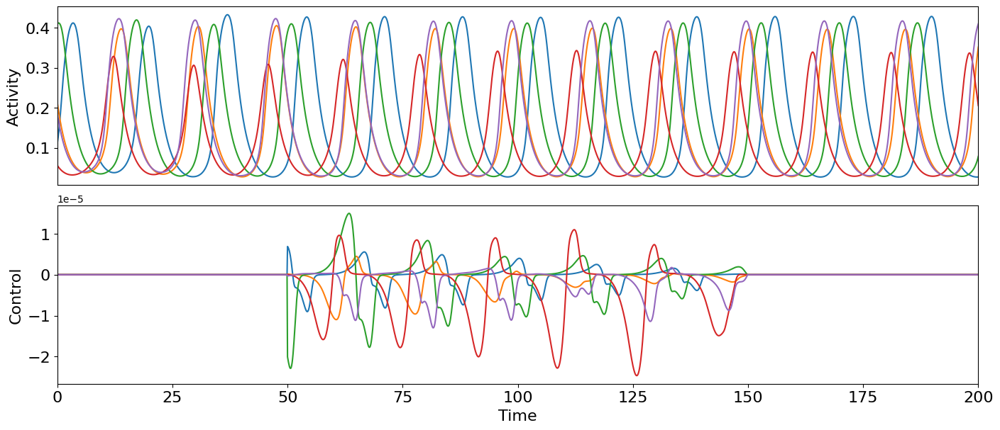

pind =  1
target period =  16.52857142857143
imet, w2 =  0 1000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.4367884718664373
Cost in iteration 10: -0.4368039236723666
Converged in iteration 17 with cost -0.43680393173093796
Final cost : -0.43680393173093796
L2 cost =  1.2989635738255167e-07
control zero, decrease w2 to  500.0
Compute control for a deterministic system
Cost in iteration 0: -0.4367884718664373
Cost in iteration 10: -0.43681899009026054
Converged in iteration 10 with cost -0.43681899009026054
Final cost : -0.43681899009026054
L2 cost =  4.542309148726247e-07
control zero, decrease w2 to  250.0
Compute control for a deterministic system
Cost in iteration 0: -0.4367884718664373
Cost in iteration 10: -0.436838325267072
Converged in iteration 12 with cost -0.436838325267072
Final cost : -0.436838325267072
L2 cost =  9.003340792595157e-07
control zero, decrease w2 to  125.0
Compute control for a determinis

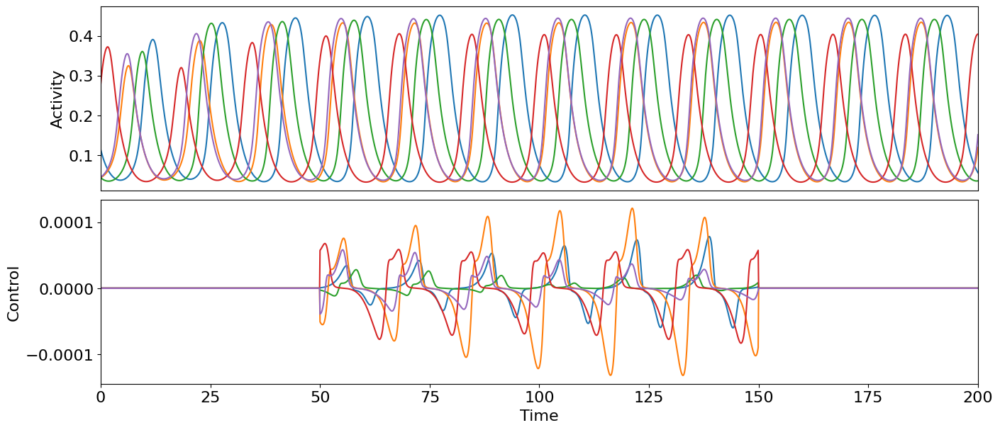

imet, w2 =  1 1000000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 1.1163152327874224
Cost in iteration 10: 1.116261271052259
Converged in iteration 12 with cost 1.116261271052259
Final cost : 1.116261271052259
L2 cost =  5.83912559562824e-10
control zero, decrease w2 to  500000.0
Compute control for a deterministic system
Cost in iteration 0: 1.1163152327874224
Cost in iteration 10: 1.1162073088843496
Converged in iteration 16 with cost 1.1162073088843492
Final cost : 1.1162073088843492
L2 cost =  2.3356543360246037e-09
control zero, decrease w2 to  250000.0
Compute control for a deterministic system
Cost in iteration 0: 1.1163152327874224
Cost in iteration 10: 1.11609938325034
Converged in iteration 10 with cost 1.11609938325034
Final cost : 1.11609938325034
L2 cost =  9.34265010783922e-09
control zero, decrease w2 to  125000.0
Compute control for a deterministic system
Cost in iteration 0: 1.1163152327874224
Cost in

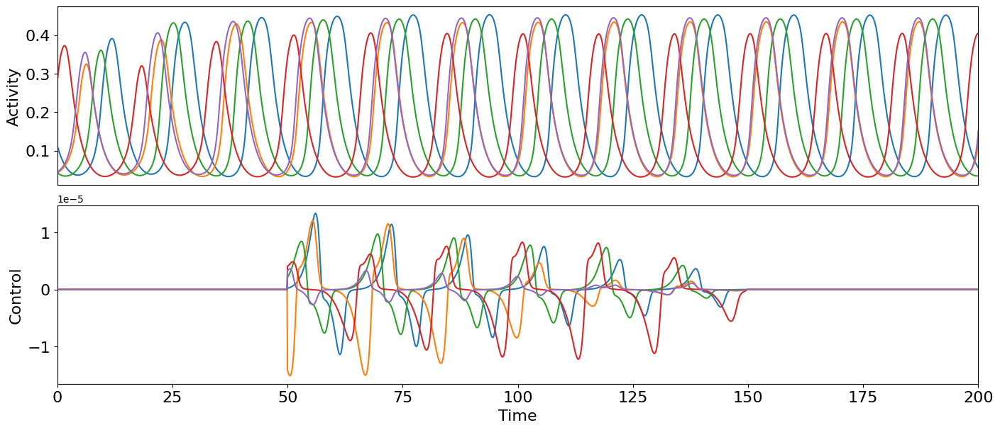

imet, w2 =  2 10000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.318563151701476
Cost in iteration 10: 0.31856196864865605
Cost in iteration 20: 0.3185619683207091
Converged in iteration 22 with cost 0.3185619683207091
Final cost : 0.3185619683207091
L2 cost =  1.2597810270396424e-09
control zero, decrease w2 to  5000.0
Compute control for a deterministic system
Cost in iteration 0: 0.318563151701476
Cost in iteration 10: 0.31856078559443335
Cost in iteration 20: 0.31856078493881684
Converged in iteration 22 with cost 0.31856078493881684
Final cost : 0.31856078493881684
L2 cost =  5.039158674720025e-09
control zero, decrease w2 to  2500.0
Compute control for a deterministic system
Cost in iteration 0: 0.318563151701476
Cost in iteration 10: 0.31855841948178015
Cost in iteration 20: 0.318558418171665
Converged in iteration 26 with cost 0.31855841817166486
Final cost : 0.31855841817166486
L2 cost =  2.0156911166914606e

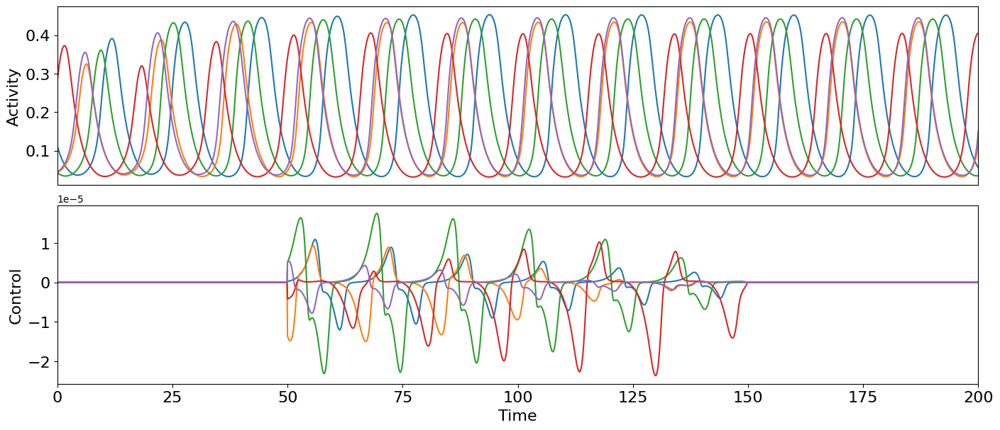

pind =  2
target period =  16.671428571428574
imet, w2 =  0 1000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.37441873390812813
Cost in iteration 10: -0.3744329728310729
Cost in iteration 20: -0.374433019029574
Converged in iteration 27 with cost -0.37443301902957465
Final cost : -0.37443301902957465
L2 cost =  8.910212604475736e-08
control zero, decrease w2 to  500.0
Compute control for a deterministic system
Cost in iteration 0: -0.37441873390812813
Cost in iteration 10: -0.37445338643149617
Cost in iteration 20: -0.37445338643940196
Converged in iteration 28 with cost -0.3744533864451835
Final cost : -0.3744533864451835
L2 cost =  6.738925332986506e-07
control zero, decrease w2 to  250.0
Compute control for a deterministic system
Cost in iteration 0: -0.37441873390812813
Converged in iteration 2 with cost -0.37447855241222144
Final cost : -0.37447855241222144
L2 cost =  1.1941504310204453e-06
control zero, decrea

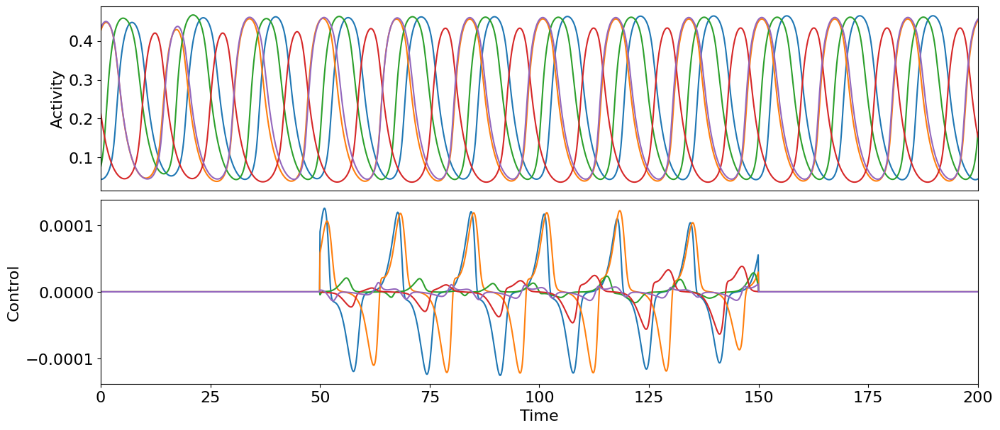

imet, w2 =  1 1000000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 4.824458645871205
Cost in iteration 10: 4.824434862338704
Cost in iteration 20: 4.824434861172831
Cost in iteration 30: 4.8244348561943555
Final cost : 4.8244348561943555
L2 cost =  2.530942063522893e-10
control zero, decrease w2 to  500000.0
Compute control for a deterministic system
Cost in iteration 0: 4.824458645871205
Cost in iteration 10: 4.824411078134684
Converged in iteration 13 with cost 4.824411078134683
Final cost : 4.824411078134683
L2 cost =  9.998906099031522e-10
control zero, decrease w2 to  250000.0
Compute control for a deterministic system
Cost in iteration 0: 4.824458645871205
Cost in iteration 10: 4.824363507703411
Converged in iteration 15 with cost 4.824363507703404
Final cost : 4.824363507703404
L2 cost =  3.9997280524923775e-09
control zero, decrease w2 to  125000.0
Compute control for a deterministic system
Cost in iteration 0:

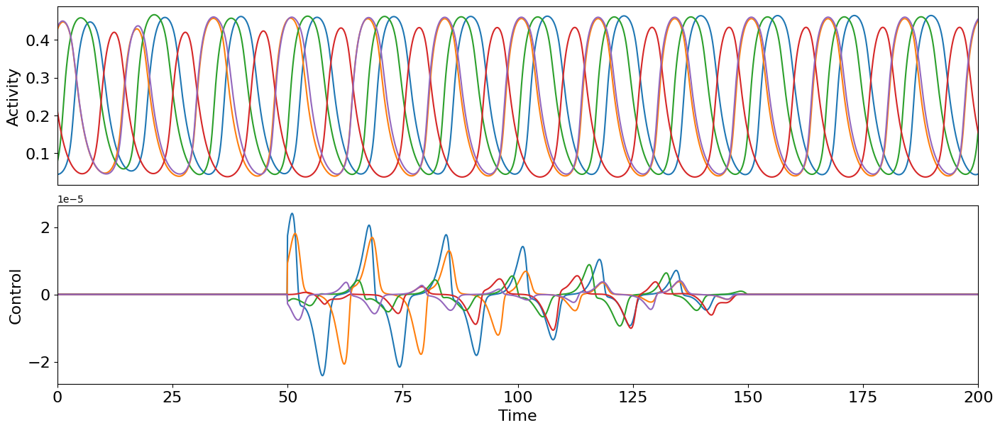

imet, w2 =  2 10000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.47801232389569476
Cost in iteration 10: 0.47801168901876673
Cost in iteration 20: 0.4780116888104604
Converged in iteration 23 with cost 0.4780116888104602
Final cost : 0.4780116888104602
L2 cost =  7.340784313446812e-10
control zero, decrease w2 to  5000.0
Compute control for a deterministic system
Cost in iteration 0: 0.47801232389569476
Cost in iteration 10: 0.47801105412530065
Cost in iteration 20: 0.4780110537087219
Converged in iteration 24 with cost 0.4780110537087214
Final cost : 0.4780110537087214
L2 cost =  2.9363633016215356e-09
control zero, decrease w2 to  2500.0
Compute control for a deterministic system
Cost in iteration 0: 0.47801232389569476
Cost in iteration 10: 0.4780097842887513
Cost in iteration 20: 0.47800978345572637
Converged in iteration 25 with cost 0.4780097834557258
Final cost : 0.4780097834557258
L2 cost =  1.174584351989382

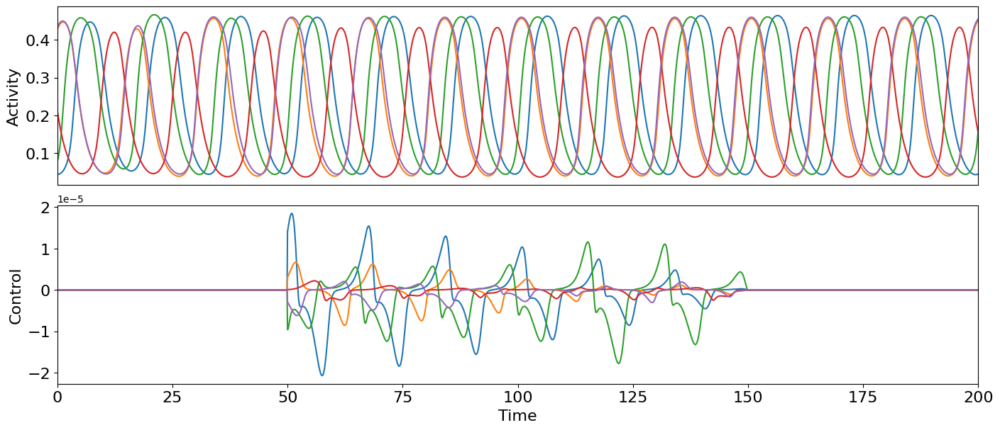

c =  2
pind =  0
target period =  17.535
imet, w2 =  0 1000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.1567149805038274
Cost in iteration 10: -0.15672556290828518
Converged in iteration 13 with cost -0.1567255629082852
Final cost : -0.1567255629082852
L2 cost =  3.8213079994783255e-08
control zero, decrease w2 to  500.0
Compute control for a deterministic system
Cost in iteration 0: -0.1567149805038274
Cost in iteration 10: -0.156740303915067
Cost in iteration 20: -0.15674038193471343
Converged in iteration 27 with cost -0.15674038199926407
Final cost : -0.15674038199926407
L2 cost =  3.751668809100577e-07
control zero, decrease w2 to  250.0
Compute control for a deterministic system
Cost in iteration 0: -0.1567149805038274
Cost in iteration 10: -0.15677010690961835
Cost in iteration 20: -0.15677013872915296
Cost in iteration 30: -0.1567701430274879
Final cost : -0.1567701430274879
L2 cost =  2.0186386355359e-06
c

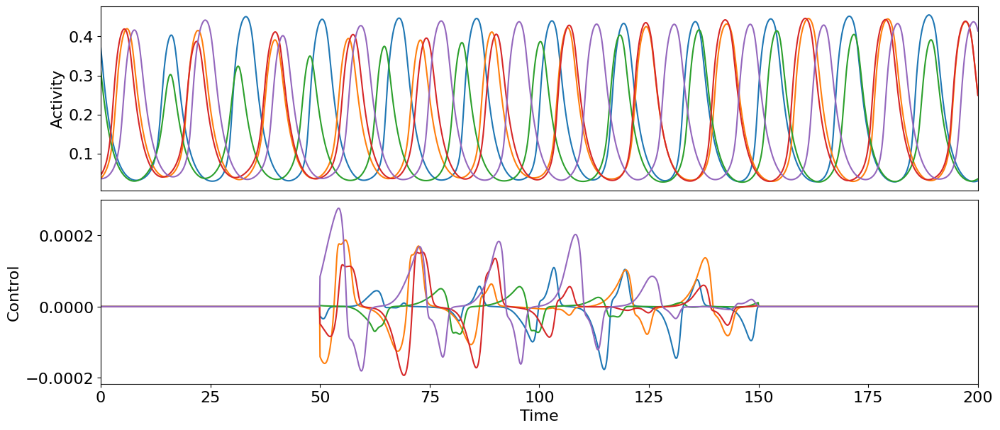

imet, w2 =  1 1000000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 7.1676619757736555
Cost in iteration 10: 7.167653345640876
Cost in iteration 20: 7.167653343011968
Converged in iteration 20 with cost 7.167653343011968
Final cost : 7.167653343011968
L2 cost =  9.577672724898864e-11
control zero, decrease w2 to  500000.0
Compute control for a deterministic system
Cost in iteration 0: 7.1676619757736555
Cost in iteration 10: 7.167644715337084
Converged in iteration 19 with cost 7.167644710078086
Final cost : 7.167644710078086
L2 cost =  3.8310977340681815e-10
control zero, decrease w2 to  250000.0
Compute control for a deterministic system
Cost in iteration 0: 7.1676619757736555
Cost in iteration 10: 7.167627454216525
Converged in iteration 17 with cost 7.1676274436937675
Final cost : 7.1676274436937675
L2 cost =  1.532462037489355e-09
control zero, decrease w2 to  125000.0
Compute control for a deterministic system
Cos

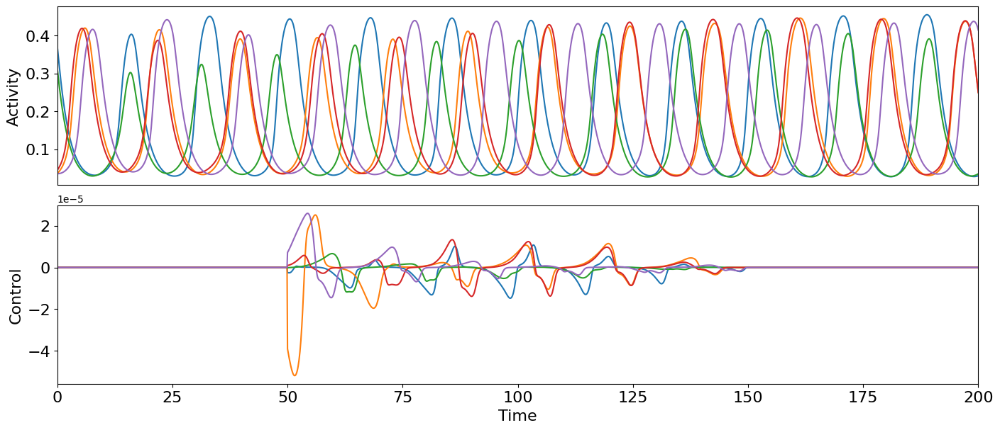

imet, w2 =  2 10000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.5941382370820028
Converged in iteration 7 with cost 0.5941368918633149
Final cost : 0.5941368918633149
L2 cost =  2.392045203147134e-09
control zero, decrease w2 to  5000.0
Compute control for a deterministic system
Cost in iteration 0: 0.5941382370820028
Cost in iteration 10: 0.5941355464251245
Converged in iteration 12 with cost 0.5941355464251245
Final cost : 0.5941355464251245
L2 cost =  9.568326633875198e-09
control zero, decrease w2 to  2500.0
Compute control for a deterministic system
Cost in iteration 0: 0.5941382370820028
Converged in iteration 5 with cost 0.5941328548901587
Final cost : 0.5941328548901587
L2 cost =  3.827447309919797e-08
control zero, decrease w2 to  1250.0
Compute control for a deterministic system
Cost in iteration 0: 0.5941382370820028
Converged in iteration 9 with cost 0.5941274691853083
Final cost : 0.5941274691853083
L2 

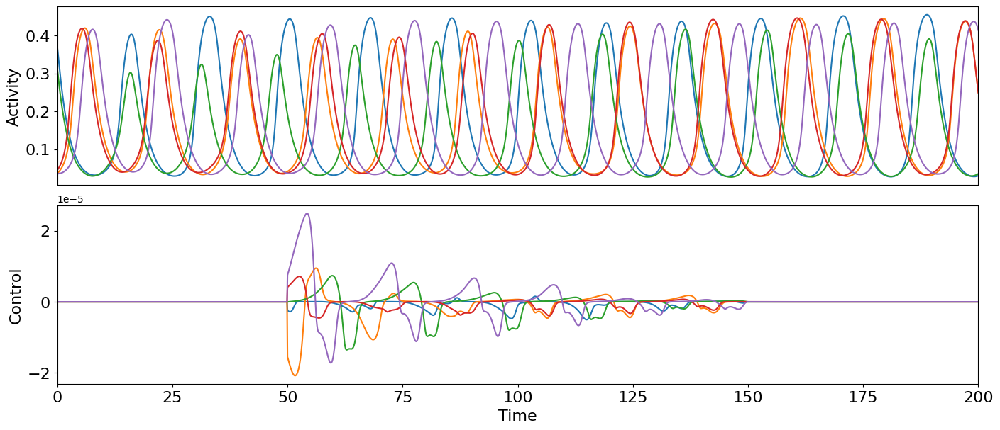

pind =  1
target period =  14.662500000000001
imet, w2 =  0 1000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.3748897239324834
Converged in iteration 3 with cost -0.37488972404830384
Final cost : -0.37488972404830384
L2 cost =  5.443383230395201e-13
control zero, decrease w2 to  500.0
Compute control for a deterministic system
Cost in iteration 0: -0.3748897239324834
Converged in iteration 3 with cost -0.37488972416411986
Final cost : -0.37488972416411986
L2 cost =  2.1773532921580803e-12
control zero, decrease w2 to  250.0
Compute control for a deterministic system
Cost in iteration 0: -0.3748897239324834
Converged in iteration 3 with cost -0.3748897243957381
Final cost : -0.3748897243957381
L2 cost =  8.709413168632321e-12
control zero, decrease w2 to  125.0
Compute control for a deterministic system
Cost in iteration 0: -0.3748897239324834
Converged in iteration 3 with cost -0.37488972485891636
Final cost : -0.37

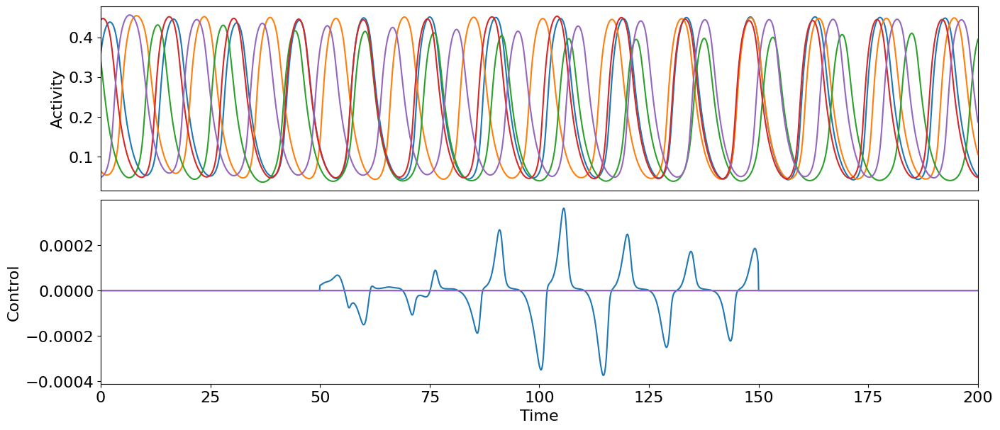

imet, w2 =  1 1000000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.1838663763488666
Cost in iteration 10: -0.18395858429108802
Cost in iteration 20: -0.1839585868316738
Cost in iteration 30: -0.18395863163735338
Final cost : -0.18395863163735338
L2 cost =  8.968360488240955e-10
control zero, decrease w2 to  500000.0
Compute control for a deterministic system
Cost in iteration 0: -0.1838663763488666
Cost in iteration 10: -0.18405079287148246
Cost in iteration 20: -0.18405079287148876
Converged in iteration 22 with cost -0.18405079287148876
Final cost : -0.18405079287148876
L2 cost =  3.609642797521474e-09
control zero, decrease w2 to  250000.0
Compute control for a deterministic system
Cost in iteration 0: -0.1838663763488666
Cost in iteration 10: -0.18423521196793152
Cost in iteration 20: -0.18423521326590547
Cost in iteration 30: -0.1842354013433579
Final cost : -0.1842354013433579
L2 cost =  1.4350033673913884e-08

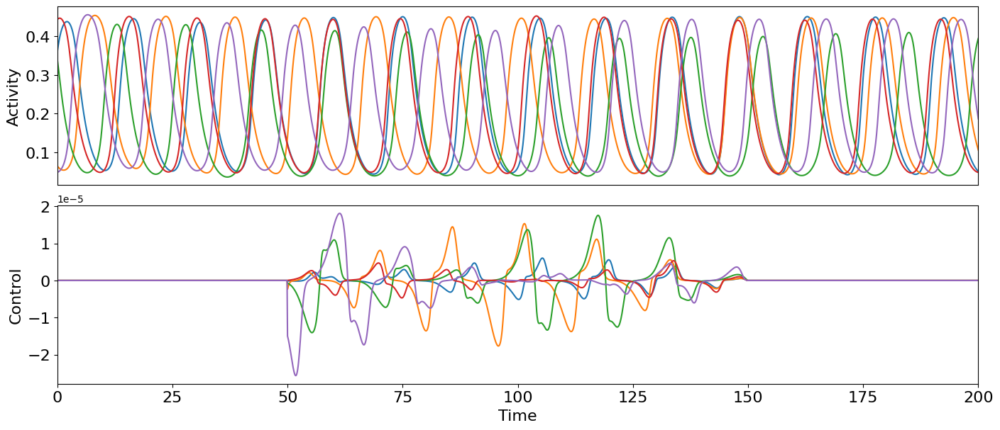

imet, w2 =  2 10000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.5946467273080249
Cost in iteration 10: 0.5946422665173932
Converged in iteration 19 with cost 0.594642266517393
Final cost : 0.594642266517393
L2 cost =  4.97596046231773e-09
control zero, decrease w2 to  5000.0
Compute control for a deterministic system
Cost in iteration 0: 0.5946467273080249
Cost in iteration 10: 0.5946378056641104
Converged in iteration 17 with cost 0.5946378056641091
Final cost : 0.5946378056641091
L2 cost =  1.990160378660806e-08
control zero, decrease w2 to  2500.0
Compute control for a deterministic system
Cost in iteration 0: 0.5946467273080249
Cost in iteration 10: 0.5946288837717613
Converged in iteration 15 with cost 0.5946288837717613
Final cost : 0.5946288837717613
L2 cost =  7.958850923134731e-08
control zero, decrease w2 to  1250.0
Compute control for a deterministic system
Cost in iteration 0: 0.5946467273080249
Cost in 

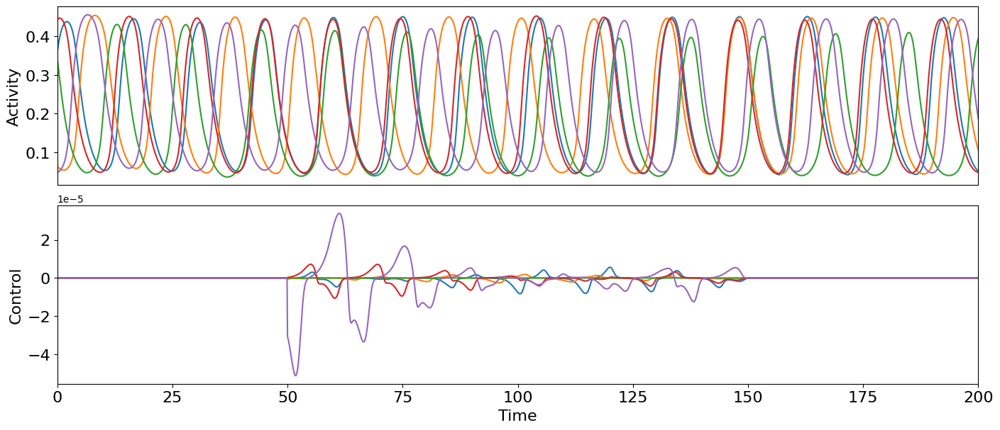

pind =  2
target period =  14.933333333333335
imet, w2 =  0 1000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.30356795880695303
Converged in iteration 5 with cost -0.3035679594226615
Final cost : -0.3035679594226615
L2 cost =  4.513969789742854e-12
control zero, decrease w2 to  500.0
Compute control for a deterministic system
Cost in iteration 0: -0.30356795880695303
Converged in iteration 4 with cost -0.3035679600383672
Final cost : -0.3035679600383672
L2 cost =  1.805588667790439e-11
control zero, decrease w2 to  250.0
Compute control for a deterministic system
Cost in iteration 0: -0.30356795880695303
Converged in iteration 8 with cost -0.30356796126977176
Final cost : -0.30356796126977176
L2 cost =  7.222360700806516e-11
control zero, decrease w2 to  125.0
Compute control for a deterministic system
Cost in iteration 0: -0.30356795880695303
Converged in iteration 6 with cost -0.30356796373255124
Final cost : -0.3

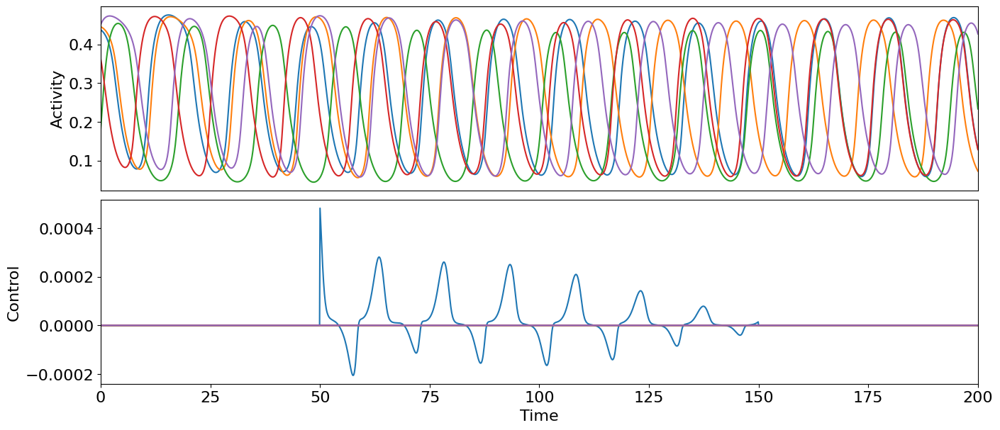

imet, w2 =  1 1000000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 5.274076257942424
Cost in iteration 10: 5.274013498862809
Converged in iteration 18 with cost 5.274013498191307
Final cost : 5.274013498191307
L2 cost =  6.965720902978485e-10
control zero, decrease w2 to  500000.0
Compute control for a deterministic system
Cost in iteration 0: 5.274076257942424
Cost in iteration 10: 5.273950738310007
Cost in iteration 20: 5.273950736955489
Converged in iteration 22 with cost 5.273950736955489
Final cost : 5.273950736955489
L2 cost =  2.786353307460938e-09
control zero, decrease w2 to  250000.0
Compute control for a deterministic system
Cost in iteration 0: 5.274076257942424
Cost in iteration 10: 5.273825212785157
Converged in iteration 19 with cost 5.27382521003
Final cost : 5.27382521003
L2 cost =  1.1145998765897084e-08
control zero, decrease w2 to  125000.0
Compute control for a deterministic system
Cost in iteratio

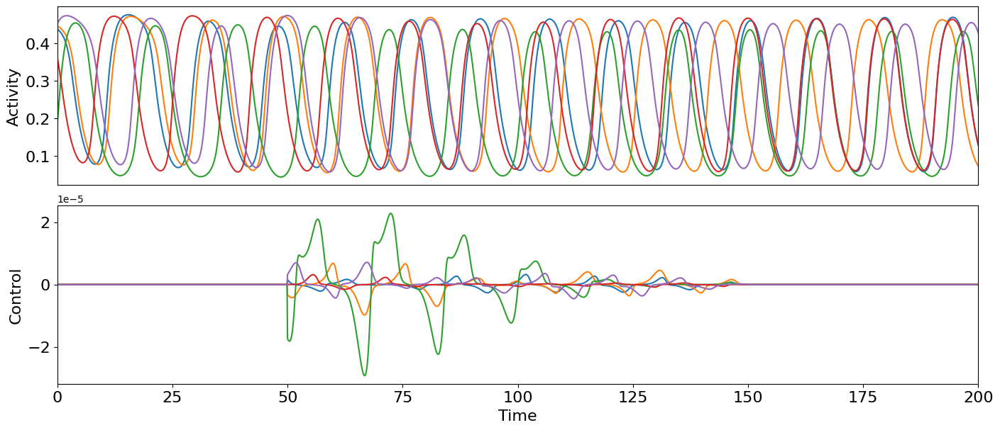

imet, w2 =  2 10000.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 0.5792002448632483
Cost in iteration 10: 0.5792002331834254
Converged in iteration 16 with cost 0.5792002331834244
Final cost : 0.5792002331834244
L2 cost =  1.2081968440967465e-11
control zero, decrease w2 to  5000.0
Compute control for a deterministic system
Cost in iteration 0: 0.5792002448632483
Cost in iteration 10: 0.5792002215038314
Converged in iteration 12 with cost 0.5792002215038314
Final cost : 0.5792002215038314
L2 cost =  4.832782873531702e-11
control zero, decrease w2 to  2500.0
Compute control for a deterministic system
Cost in iteration 0: 0.5792002448632483
Cost in iteration 10: 0.579200198145353
Converged in iteration 17 with cost 0.5792001981453507
Final cost : 0.5792001981453507
L2 cost =  1.933114320863385e-10
control zero, decrease w2 to  1250.0
Compute control for a deterministic system
Cost in iteration 0: 0.5792002448632483
Cost 

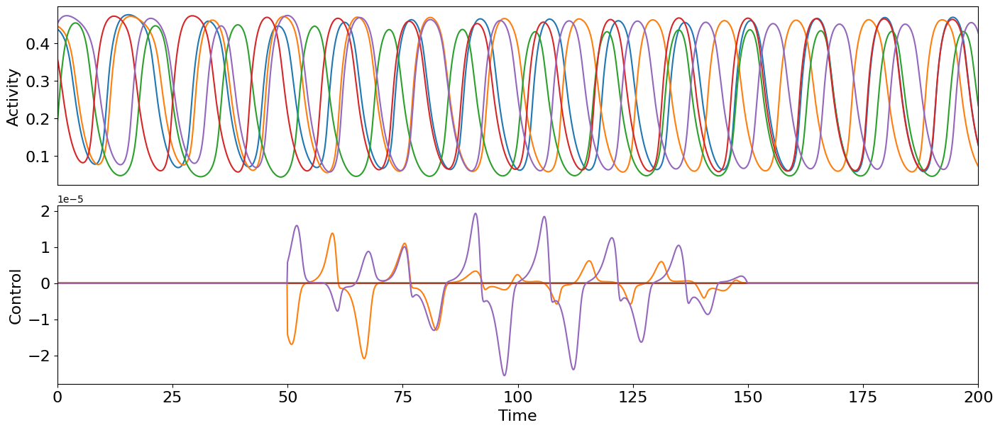

In [164]:
it = 30
pr = np.arange(0,2001,10)
maxstr = 10.
init_control = zero_control.copy()
LIMC = [1e-6]

skip_array = [ ]

for c in range(len(cmats)):
    print("c = ", c)

    model = WCModel(Cmat=cmats[c], Dmat=dmats[c])

    dt = model.params['dt']
    model.params.signalV = 1.

    nmaxdel = model.getMaxDelay()

    for pind in range(len(points)):

        print("pind = ", pind)

        if [c, pind] in skip_array:
            continue
        
        p = points[pind]
        
        testd = 1000.
        model.params.duration = testd
        test_input = ZeroInput().generate_input(duration=testd+dt, dt=dt)
        test_input[0,:500] = 5.
        model.params["exc_ext"] = test_input + p[0]
        model.params["inh_ext"] = test_input + p[1]

        einit = np.zeros((N, nmaxdel+1))
        iinit = np.zeros((N, nmaxdel+1))

        model.params["exc_init"] = einit
        model.params["inh_init"] = iinit
        model.run()

        for n in range(N):
            einit[n,:] = model.exc[n,-1]
            iinit[n,:] = model.inh[n,-1]

        model.params.duration = duration

        model.params["exc_ext"] = zero_control[:,0,:] + p[0]
        model.params["inh_ext"] = zero_control[:,0,:] + p[1]

        model.params["exc_init"] = einit
        model.params["inh_init"] = iinit

        model.run()
            
        int0 = 500
        int1 = 1500

        print("target period = ", periods_array[c, pind])

        for imet in range(3):

            for wind in [0]:

                w2 = results["w2"][c, pind, imet, wind]
                w2 = 0

                if imet == 0:
                    w2 = 1e3
                    LIMC[0] = 1e-5
                elif imet == 1:
                    w2 = 1e6
                    LIMC[0] = 1e-7
                elif imet == 2:
                    w2 = 1e4

                print("imet, w2 = ", imet, w2)

                model_controlled = oc_wc.OcWc(model, periods_array[c, pind], print_array=pr, cost_interval=(int0,int1), control_interval=(int0,int1), cost_matrix=costmat, control_matrix = controlmat)
                model_controlled.maximum_control_strength = maxstr
                model_controlled.channelwise_optimization = True
                model_controlled.step = 1e-2
                model_controlled.weights["w_p"] = 0.
                model_controlled.weights["w_2"] = w2

                if imet == 0:
                    model_controlled.weights["w_f_sync"] = 1.
                elif imet == 1:
                    model_controlled.weights["w_cc"] = 1.
                elif imet == 2:
                    model_controlled.weights["w_var"] = 1.
                #elif imet == 3:
                #    model_controlled.weights["w_f_sync"] = 1.
                #    model_controlled.weights["w_cc"] = 1.


                if False:
                    if type(results["controls"][c][pind][imet][wind]) != type(None):
                        model_controlled.control = results["controls"][c][pind][imet][wind].copy()
                        model_controlled.update_input()

                model_controlled.optimize(30)

                L2cost = np.sum(cost_functions.L2_cost(model_controlled.control))
                print("L2 cost = ", L2cost)

                while L2cost < LIMC[0]:
                    w2 /= 2.
                    model_controlled.weights["w_2"] = w2
                    print("control zero, decrease w2 to ", w2)
                    
                    model_controlled.control = zero_control
                    model_controlled.update_input()
                    model_controlled.step = 1e-2
                    model_controlled.zero_step_encountered = False
                    model_controlled.optimize(30)
                    L2cost = np.sum(cost_functions.L2_cost(model_controlled.control))
                    print("L2 cost = ", L2cost)

                w2 *= 2.

                model_controlled.weights["w_2"] = w2
                print("zero control boundary reached with w2 = ", w2)
                
                model_controlled.control = zero_control
                model_controlled.update_input()
                model_controlled.step = 1e-2
                model_controlled.zero_step_encountered = False
                model_controlled.optimize(30)

                results["controls"][c][pind][imet][wind] = model_controlled.control.copy()
                state = model_controlled.get_xs()
                results["states"][c][pind][imet][wind] = state

                timings, periods = getperiods(state, dt, N, interval=(int0, int1))
                results["timings"][c][pind][imet][wind] = timings
                results["periods"][c][pind][imet][wind] = periods
                results["nat_periods"][c, pind, imet, wind] = periods_array[c, pind]
                results["distance"][c, pind, imet, wind] = get_sim(state, N, periods_array[c, pind]/dt)
                results["w2"][c, pind, imet, wind] = w2
                results["L2cost"][c, pind, imet, wind] = np.sum(cost_functions.L2_cost(model_controlled.control))

                fname = str(c) + "_" + str(pind) + "_" + str(imet) + "_" + str(wind) + ".png"
                plot_oc_nw(N, duration, dt, model_controlled.get_xs(), 200, model_controlled.control, filename= os.path.join(dir, fname))

        # save after each cmat point
        with open(os.path.join(pickledir, 'snyc_5n_sim_mix.pickle'), 'wb') as f:
            pickle.dump(results, f)

In [ ]:
for c in range(len(cmats)):
    for pind in range(len(points)):
        for imet in [0]:
            for wind in range(0, w2_n):

                print(results["w2"][c, pind, imet, wind])

15.625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
250.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
250.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
31.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
31.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
31.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
31.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.244140625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.9765625
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [195]:
it = 4000
pr = np.arange(0,2001,100)
maxstr = 10.
init_control = zero_control.copy()
LIMC = 1.
skip_array = [ ]
int0 = 500
int1 = 1500

for c in range(len(cmats)):
    print("c = ", c)

    model = WCModel(Cmat=cmats[c], Dmat=dmats[c])

    dt = model.params['dt']
    model.params.signalV = 1.

    nmaxdel = model.getMaxDelay()

    for pind in range(len(points)):

        print("pind = ", pind)

        if [c, pind] in skip_array: continue

        p = points[pind]
        
        testd = 1000.
        model.params.duration = testd
        test_input = ZeroInput().generate_input(duration=testd+dt, dt=dt)
        test_input[0,:500] = 5.
        model.params["exc_ext"] = test_input + p[0]
        model.params["inh_ext"] = test_input + p[1]

        einit = np.zeros((N, nmaxdel+1))
        iinit = np.zeros((N, nmaxdel+1))

        model.params["exc_init"] = einit
        model.params["inh_init"] = iinit
        model.run()

        for n in range(N):
            einit[n,:] = model.exc[n,-1]
            iinit[n,:] = model.inh[n,-1]

        model.params.duration = duration

        model.params["exc_ext"] = zero_control[:,0,:] + p[0]
        model.params["inh_ext"] = zero_control[:,0,:] + p[1]

        model.params["exc_init"] = einit
        model.params["inh_init"] = iinit

        model.run()

        print("target period = ", periods_array[c, pind])

        for imet in range(4):

            if imet == 3: continue
            
            for wind in range(1, w2_n, 1):

                w2 = results["w2"][c, pind, imet, wind]
                    
                if w2 == 0.0:
                    w2 = results["w2"][c, pind, imet, 0] / (2**wind)
                else:
                    if w2 != results["w2"][c, pind, imet, 0] / (2**wind):
                        print("WARNING: change w2")
                        results["controls"][c][pind][imet][wind] = None
                        w2 = results["w2"][c, pind, imet, 0] / (2**wind)

                print("imet, w2 = ", imet, w2)

                model_controlled = oc_wc.OcWc(model, periods_array[c, pind], print_array=pr, cost_interval=(int0,int1), control_interval=(int0,int1), cost_matrix=costmat, control_matrix = controlmat)
                model_controlled.maximum_control_strength = maxstr
                model_controlled.channelwise_optimization = True
                model_controlled.step = 1e-3
                model_controlled.weights["w_p"] = 0.
                model_controlled.weights["w_2"] = w2

                if imet == 0:
                    model_controlled.weights["w_f_sync"] = 1.
                elif imet == 1:
                    model_controlled.weights["w_cc"] = 1.
                elif imet == 2:
                    model_controlled.weights["w_var"] = 1.
                    
                elif imet == 3:
                    model_controlled.weights["w_2"] = 1.

                    if [c, pind] == [0,0]:
                        wf, wcc = 1. / 0.016, 1. / 16.
                    elif [c, pind] == [0,1]:
                        wf, wcc = 1. / results["w2"][c, pind, 0, 7], 1. / results["w2"][c, pind, 1, 7]
                    elif [c, pind] == [0,2]:
                        wf, wcc = 1. / results["w2"][c, pind, 0, 7], 1. / results["w2"][c, pind, 1, 4]
                    elif [c, pind] == [1,0]:
                        wf, wcc = 1. / results["w2"][c, pind, 0, 7], 1. / results["w2"][c, pind, 1, 7]
                    elif [c, pind] == [1,1]:
                        wf, wcc = 1. / results["w2"][c, pind, 0, 7], 1. / results["w2"][c, pind, 1, 7]
                    elif [c, pind] == [1,2]:
                        wf, wcc = 1. / results["w2"][c, pind, 0, 7], 1. / results["w2"][c, pind, 1, 7]
                    elif [c, pind] == [2,0]:
                        wf, wcc = 1. / results["w2"][c, pind, 0, 0], 1. / results["w2"][c, pind, 1, 0]
                    elif [c, pind] == [2,1]:
                        wf, wcc = 1. / results["w2"][c, pind, 0, 1], 1. / results["w2"][c, pind, 1, 3]
                    elif [c, pind] == [2,2]:
                        wf, wcc = 1. / results["w2"][c, pind, 0, 2], 1. / results["w2"][c, pind, 1, 4]
                    else: continue

                    if wind == 0:
                        model_controlled.weights["w_f_sync"] = wf
                        model_controlled.weights["w_cc"] = wcc
                    elif wind == 1:
                        model_controlled.weights["w_f_sync"] = 2. * wf
                        model_controlled.weights["w_cc"] = wcc
                    elif wind == 2:
                        model_controlled.weights["w_f_sync"] = wf
                        model_controlled.weights["w_cc"] = 2. * wcc
                    elif wind == 3:
                        model_controlled.weights["w_f_sync"] = 0.5 * wf
                        model_controlled.weights["w_cc"] = wcc
                    elif wind == 4:
                        model_controlled.weights["w_f_sync"] = wf
                        model_controlled.weights["w_cc"] = 0.5 * wcc
                    elif wind == 5:
                        model_controlled.weights["w_f_sync"] = 2. * wf
                        model_controlled.weights["w_cc"] = 2. * wcc
                    elif wind == 6:
                        model_controlled.weights["w_f_sync"] = 0.5 * wf
                        model_controlled.weights["w_cc"] = 0.5 * wcc
                    else:
                        continue

                if True:
                    if type(results["controls"][c][pind][imet][wind]) != type(None):
                        model_controlled.control = results["controls"][c][pind][imet][wind].copy()
                        model_controlled.update_input()

                model_controlled.optimize(it)

                results["controls"][c][pind][imet][wind] = model_controlled.control.copy()
                state = model_controlled.get_xs()
                results["states"][c][pind][imet][wind] = state

                timings, periods = getperiods(state, dt, N, interval=(int0+300, int1))
                results["timings"][c][pind][imet][wind] = timings
                results["periods"][c][pind][imet][wind] = periods
                results["nat_periods"][c, pind, imet, wind] = periods_array[c, pind]
                results["distance"][c, pind, imet, wind] = get_sim(state, N, periods_array[c, pind]/dt)
                results["w2"][c, pind, imet, wind] = w2
                results["L2cost"][c, pind, imet, wind] = np.sum(cost_functions.L2_cost(model_controlled.control))

                if False:
                    fname = str(c) + "_" + str(pind) + "_" + str(imet) + "_" + str(wind) + ".png"
                    plot_oc_nw(N, duration, dt, model_controlled.get_xs(), 200, model_controlled.control, filename= os.path.join(dir, fname))

        # save after each cmat point
        with open(os.path.join(pickledir, 'snyc_5n_sim_mix.pickle'), 'wb') as f:
            pickle.dump(results, f)

c =  0
pind =  0
target period =  18.226315789473684
imet, w2 =  0 7.8125
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.10093336212944182
Converged in iteration 2 with cost -0.10093336212944182
Final cost : -0.10093336212944182
imet, w2 =  0 3.90625
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.10097986251040536
Converged in iteration 2 with cost -0.10097986251040536
Final cost : -0.10097986251040536
imet, w2 =  0 1.953125
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.10107357878753874
Converged in iteration 1 with cost -0.10107357878753874
Final cost : -0.10107357878753874
imet, w2 =  0 0.9765625
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: -0.10126410952836647
Converged in iteration 1 with cost -0.10126410952836647
Fin

In [197]:
with open(os.path.join(pickledir, 'snyc_5n_sim_mix.pickle'), 'wb') as f:
    pickle.dump(results, f)

In [12]:
with open(os.path.join(pickledir, 'snyc_5n_sim_mix.pickle'), 'rb') as f:
    res_read = pickle.load(f)
    print(res_read.keys() )

results = res_read.copy()
cmats = results["cmats"].copy()
dmats = results["dmats"].copy()

print(cmats)

dict_keys(['controls', 'periods', 'timings', 'states', 'nat_periods', 'w2', 'L2cost', 'distance', 'cmats', 'dmats'])
[array([[0, 1, 0, 0, 0],
       [1, 0, 1, 0, 0],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1],
       [0, 0, 0, 1, 0]]), array([[0, 0, 1, 1, 1],
       [0, 0, 1, 0, 1],
       [1, 1, 0, 0, 1],
       [0, 1, 0, 0, 0],
       [1, 1, 1, 0, 0]]), array([[0, 1, 1, 1, 1],
       [1, 0, 1, 1, 1],
       [0, 0, 0, 1, 1],
       [1, 1, 1, 0, 1],
       [1, 1, 1, 1, 0]])]


0 0


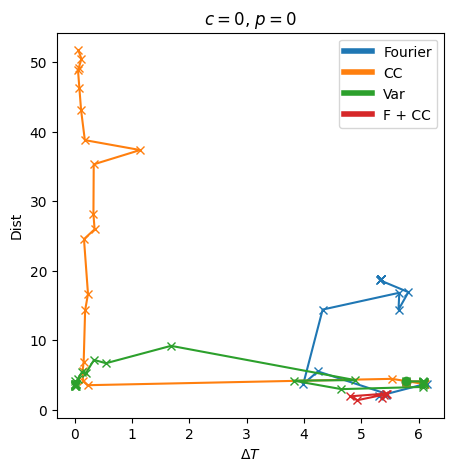

0 1


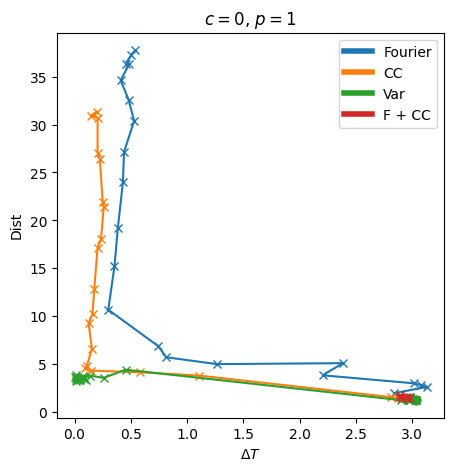

0 2


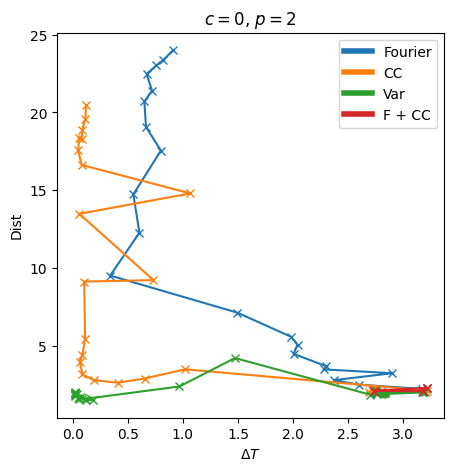

1 0


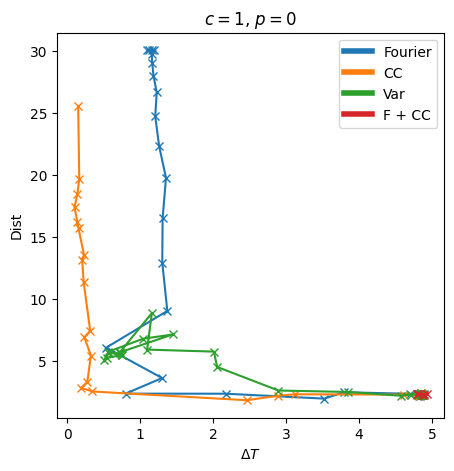

1 1


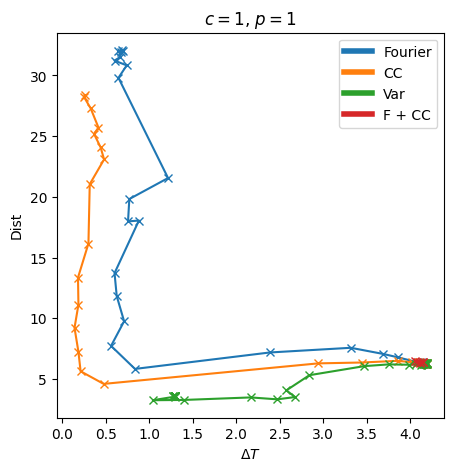

1 2


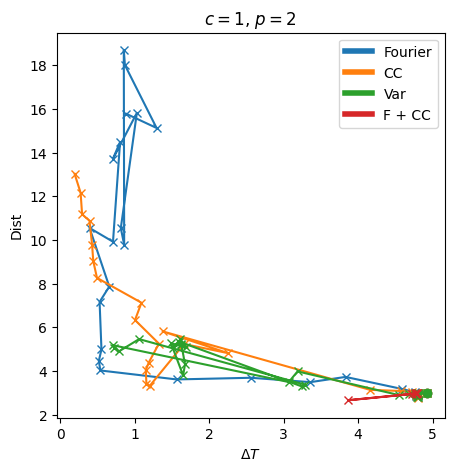

2 0


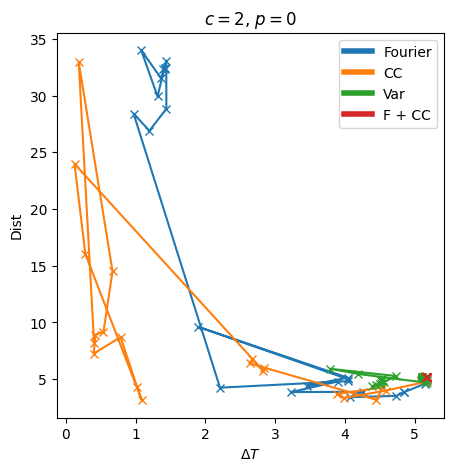

2 1


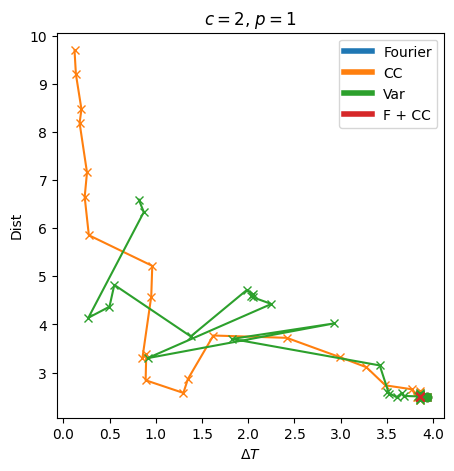

2 2


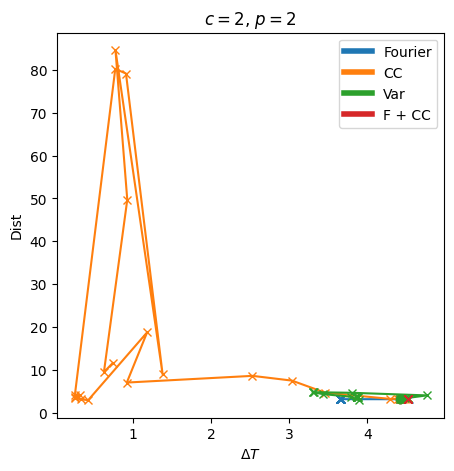

In [13]:
from matplotlib.lines import Line2D
custom_legend = [Line2D([0], [0], color=colors[0], lw=4),
                Line2D([0], [0], color=colors[1], lw=4),
                Line2D([0], [0], color=colors[2], lw=4),
                Line2D([0], [0], color=colors[3], lw=4)]

for c in range(len(cmats)):
    
    for pind in range(len(points)):
        print(c, pind)

        fig, ax = plt.subplots(1, 1, figsize =(5, 5))

        for imet in range(4):
            delta_t = []
            dist = []

            for iw in range(w2_n):
                data = results["timings"][c][pind][imet][iw]
                ydata_ = []

                if data is None:
                    continue

                list_mean_dt = []

                for n1 in range(N):
                    list_dt = []
                    for n2 in range(N):
                        if n1 == n2:
                            continue
                        for p in data[n2]:
                            list_dt.append(np.amin(np.abs(p - data[n1])) * dt)

                    list_mean_dt.append(np.mean(list_dt))

                delta_t.append(np.mean(list_mean_dt))
                dist.append(results["distance"][c,pind,imet,iw])

                if iw == 0:
                    ax.plot(delta_t, dist, marker="o", color=colors[imet])

            ax.plot(delta_t, dist, marker="x", color=colors[imet])

        ax.set_ylabel(r"Dist")
        ax.set_xlabel(r"$\Delta T$")

        #ax.set_xlim(0,6.5)

        ax.set_title(r"$c = $" + str(c) +  r", $p = $" + str(pind))

        ax.legend(custom_legend, ['Fourier', 'CC', 'Var', 'F + CC'])

        plt.show()
        fig.savefig(os.path.join(dir, "corr_" + str(c) + "_" + str(pind) + ".png"), bbox_inches='tight')